<a href="https://colab.research.google.com/github/Manith-Ratnayake/Data-Enginnering/blob/main/Data_Engineering2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **1. Data Pre Proccessing**

In [1]:
# Google drive and google collab connection
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# In google collab pyspark is not pre installed
!pip install pyspark

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 317.0/317.0 MB 2.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyspark: filename=pyspark-3.5.1-py2.py3-none-any.whl size=317488491 sha256=34dfb550eefa69cec775f93b9e93d19dfb23d2a1926c6d4436e5d27486d989b5
  Stored in directory: /root/.cache/pip/wheels/80/1d/60/2c256ed38dddce2fdd93be545214a63e02fbd8d74fb0b7f3a6
Successfully built pyspark


### **Preparing Data**

In [3]:
# Essential Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
# Pysaprk Library
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, mean, median, stddev

In [5]:
# Creating a py spark session
spark = SparkSession.builder.appName("sparkApp").getOrCreate()

In [6]:
# Reading three files
col_mat_nuw_data = spark.read.csv("/content/drive/My Drive/Data Engineering/col_mat_nuw_output.csv", header=False, inferSchema = True)
kan_data         = spark.read.csv("/content/drive/My Drive/Data Engineering/kan_output.csv", header=False, inferSchema = True )
mon_kur_jaf_data = spark.read.csv("/content/drive/My Drive/Data Engineering/mon_kur_jaf_output.csv", header=False, inferSchema = True)

# Combining all files into 1 file
df_spark = col_mat_nuw_data.union(mon_kur_jaf_data).union(kan_data)

# Checking the current column names
print(df_spark.columns)

# Rename the columns to more meaningful names
df_spark = df_spark.withColumnRenamed('_c0', 'HCHO Reading') \
                   .withColumnRenamed('_c1', 'Location') \
                   .withColumnRenamed('_c2', 'Current Date') \
                   .withColumnRenamed('_c3', 'Next Date')

print(df_spark.columns)

['_c0', '_c1', '_c2', '_c3']
['HCHO Reading', 'Location', 'Current Date', 'Next Date']


In [7]:
from pyspark.sql.functions import to_date

# Convert 'Current Date' and 'Next Date' columns from object to date data type
df_spark = df_spark.withColumn('Current Date', to_date(df_spark['Current Date'], 'yyyy/MM/dd'))
df_spark = df_spark.withColumn('Next Date', to_date(df_spark['Next Date'], 'yyyy/MM/dd'))

In [8]:
# Data types in the column
for col_name, data_type in df_spark.dtypes:
    print(f"Column '{col_name}' has data type: {data_type}")

Column 'HCHO Reading' has data type: double
Column 'Location' has data type: string
Column 'Current Date' has data type: date
Column 'Next Date' has data type: date


In [9]:
df_spark.printSchema()

root
 |-- HCHO Reading: double (nullable = true)
 |-- Location: string (nullable = true)
 |-- Current Date: date (nullable = true)
 |-- Next Date: date (nullable = true)



In [10]:
df_spark.show()

+--------------------+--------------+------------+----------+
|        HCHO Reading|      Location|Current Date| Next Date|
+--------------------+--------------+------------+----------+
|1.969834395781014...|Colombo Proper|  2019-01-01|2019-01-02|
|2.625522171968594...|Colombo Proper|  2019-01-02|2019-01-03|
|9.852118897938794E-5|Colombo Proper|  2019-01-03|2019-01-04|
|2.099320518114242E-4|Colombo Proper|  2019-01-04|2019-01-05|
|1.785337298892930...|Colombo Proper|  2019-01-05|2019-01-06|
|1.082296700235670...|Colombo Proper|  2019-01-06|2019-01-07|
|3.926829280477309...|Colombo Proper|  2019-01-07|2019-01-08|
|9.153156350685351E-5|Colombo Proper|  2019-01-08|2019-01-09|
|1.205978992853015...|Colombo Proper|  2019-01-09|2019-01-10|
|1.297723562983258...|Colombo Proper|  2019-01-10|2019-01-11|
|2.239188166801278...|Colombo Proper|  2019-01-11|2019-01-12|
|1.569418094178759...|Colombo Proper|  2019-01-12|2019-01-13|
|                NULL|Colombo Proper|  2019-01-13|2019-01-14|
|1.33629

###**Missing Values**

In [11]:
from pyspark.sql.functions import col, sum as pyspark_sum

# Define a list of column names
columns = df_spark.columns

# Create a dictionary to store the count of missing values for each column
missing_value_counts = {}

# Loop through each column and count the missing values
for col_name in columns:
    missing_count = df_spark.filter(col(col_name).isNull()).count()
    missing_value_counts[col_name] = missing_count

# Print the count of missing values for each column
print("Number of missing values in each column:\n")
for col_name, count in missing_value_counts.items():
    print(col_name, ": ", count)

Number of missing values in each column:

HCHO Reading :  4864
Location :  0
Current Date :  0
Next Date :  0


###**Filling the missing values**

In [12]:
from pyspark.sql.functions import mean as pyspark_mean, when

# Impute missing values for numerical columns with the mean
numerical_columns = ['HCHO Reading']  # Assuming 'HCHO Reading' is the only numerical column
for col_name in numerical_columns:
    mean_value = df_spark.select(pyspark_mean(col(col_name)).alias('mean')).collect()[0]['mean']
    df_spark = df_spark.withColumn(col_name, when(col(col_name).isNull(), mean_value).otherwise(col(col_name)))

# Impute missing values for categorical columns with the most frequent category
categorical_columns = ['Location', 'Current Date', 'Next Date']  # Assuming these are categorical columns
for col_name in categorical_columns:
    most_frequent_value = df_spark.groupBy(col_name).count().orderBy(col('count').desc()).first()[col_name]
    df_spark = df_spark.withColumn(col_name, when(col(col_name).isNull(), most_frequent_value).otherwise(col(col_name)))

# Recheck missing values after imputation
missing_value_counts_after_imputation = {}
for col_name in df_spark.columns:
    missing_count = df_spark.filter(col(col_name).isNull()).count()
    missing_value_counts_after_imputation[col_name] = missing_count

# Print the count of missing values for each column after imputation
print("Number of missing values in each column after imputation:")
for col_name, count in missing_value_counts_after_imputation.items():
    print(col_name, ": ", count)

Number of missing values in each column after imputation:
HCHO Reading :  0
Location :  0
Current Date :  0
Next Date :  0


In [13]:
df_spark.describe()

DataFrame[summary: string, HCHO Reading: string, Location: string]

In [51]:
df_pandas = df_spark.toPandas()
df_pandas.describe()

,HCHO Reading
count,12782.000000
mean,0.000119
std,0.000073
min,-0.000352
25%,0.000093
50%,0.000119
75%,0.000132
max,0.000900


###**Statistics of Data**

In [14]:
from pyspark.sql.functions import abs, stddev, mean, col

# Calculate mean and standard deviation for each location
location_stats = df_spark.groupBy('Location').agg(mean('HCHO Reading').alias('mean'), stddev('HCHO Reading').alias('stddev'))

# Join the mean and standard deviation back to the original DataFrame
df_with_stats = df_spark.join(location_stats, on='Location', how='left')

# Define z-score threshold
z_score_threshold = 3

# Calculate z-score for each data point within its location group
df_filtered = df_with_stats.withColumn('z_score', abs(col('HCHO Reading') - col('mean')) / col('stddev')) \
                           .filter(col('z_score') <= z_score_threshold)


In [15]:
from pyspark.sql.functions import mean, median, stddev

# Calculate descriptive statistics for each city
city_statistics = df_spark.groupBy('Location') \
    .agg(mean('HCHO Reading').alias('Mean HCHO Reading'),
         median('HCHO Reading').alias('Median HCHO Reading'),
         stddev('HCHO Reading').alias('Stddev HCHO Reading'))

# Calculate descriptive statistics across the entire dataset
overall_statistics = df_spark.agg(mean('HCHO Reading').alias('Overall Mean HCHO Reading'),
                                  median('HCHO Reading').alias('Overall Median HCHO Reading'),
                                  stddev('HCHO Reading').alias('Overall Stddev HCHO Reading'))

# Show descriptive statistics for each city
print("Descriptive statistics for each city:")
city_statistics.show()

# Show descriptive statistics across the entire dataset
print("Descriptive statistics across the entire dataset:")
overall_statistics.show()

Descriptive statistics for each city:
+-------------------+--------------------+--------------------+--------------------+
|           Location|   Mean HCHO Reading| Median HCHO Reading| Stddev HCHO Reading|
+-------------------+--------------------+--------------------+--------------------+
|   Deniyaya, Matara|1.044686072749091...|1.192778916513748...|7.246053723404124E-5|
|     Colombo Proper|1.480916996036323...|1.192778916513748...| 8.67733015675361E-5|
|Nuwara Eliya Proper|1.065550795445532...|1.192778916513748...|5.545511452384686E-5|
|  Kurunegala Proper|1.292407039248092...|1.192778916513748...|7.165767483552864E-5|
| Bibile, Monaragala|1.237086665854354...|1.192778916513748...|7.406584214357455E-5|
|      Jaffna Proper|1.109013636756122...|1.192778916513748...|7.028672595049762E-5|
|       Kandy Proper|1.119791209506632E-4|1.192778916513748...| 6.94968491286915E-5|
+-------------------+--------------------+--------------------+--------------------+

Descriptive statistics acr

###**Further Analysis**

In [16]:
# Specify the path to save the CSV file (adjust the path as necessary)
output_path = "/content/drive/My Drive/Data Engineering/combined_output.csv"

# Write the DataFrame to a single CSV file
df_spark.coalesce(1).write.csv(output_path, mode="overwrite", header=True)

import os

# Find the part file in the directory
output_directory = "/content/drive/My Drive/Data Engineering/combined_output.csv"
part_file = [f for f in os.listdir(output_directory) if f.startswith('part') and f.endswith('.csv')][0]
part_file_path = os.path.join(output_directory, part_file)

# Rename the part file for simplicity
final_output_path = "/content/drive/My Drive/Data Engineering/final_combined_output.csv"
os.rename(part_file_path, final_output_path)

# Download the file
from google.colab import files
files.download(final_output_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#**2. Spatio-Temporal Analysis**

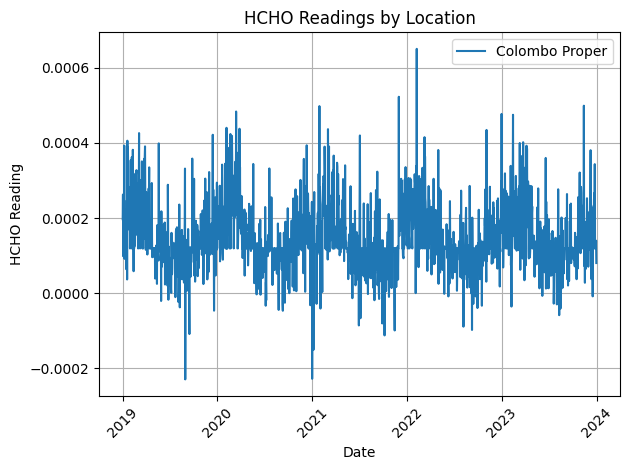

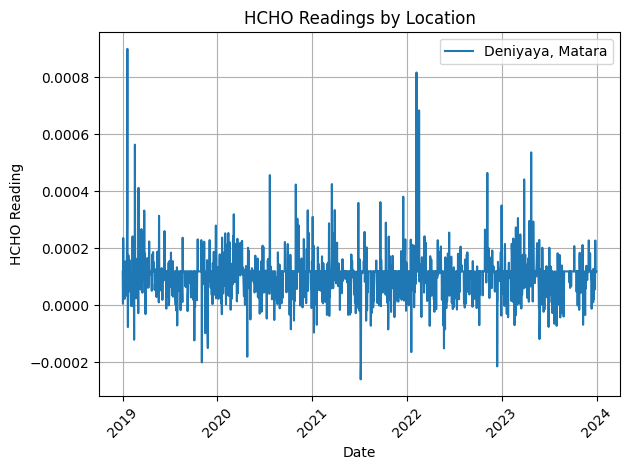

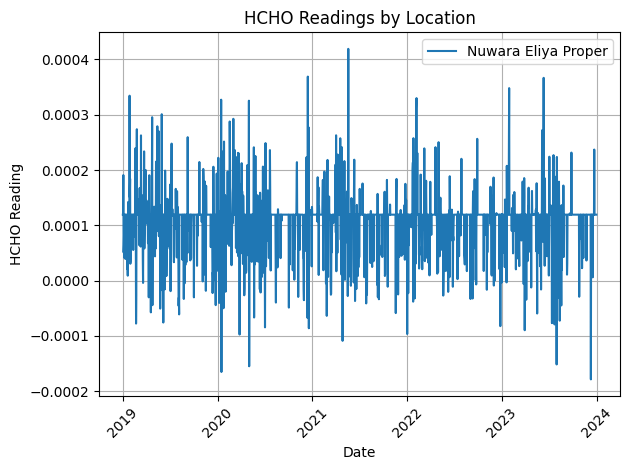

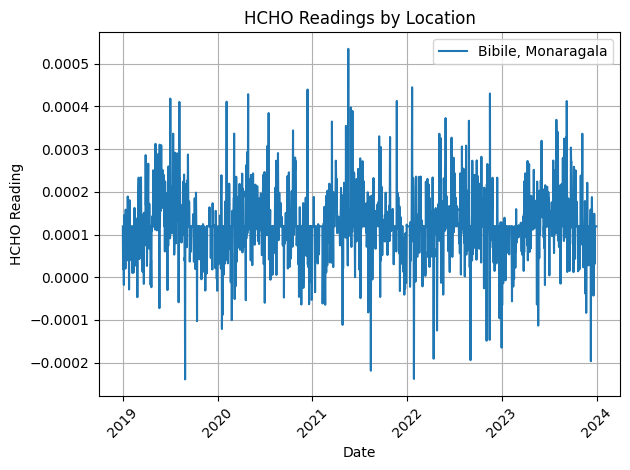

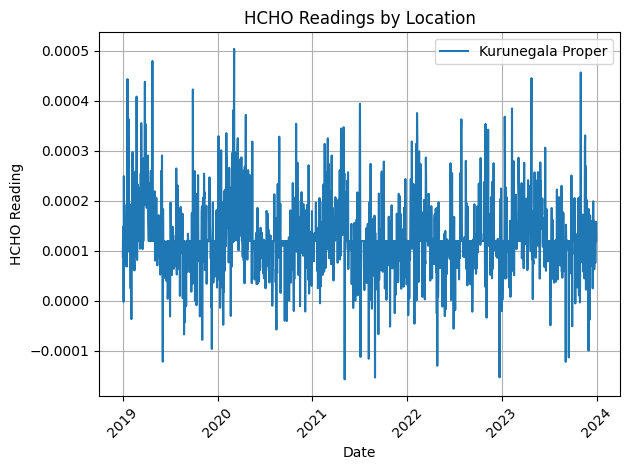

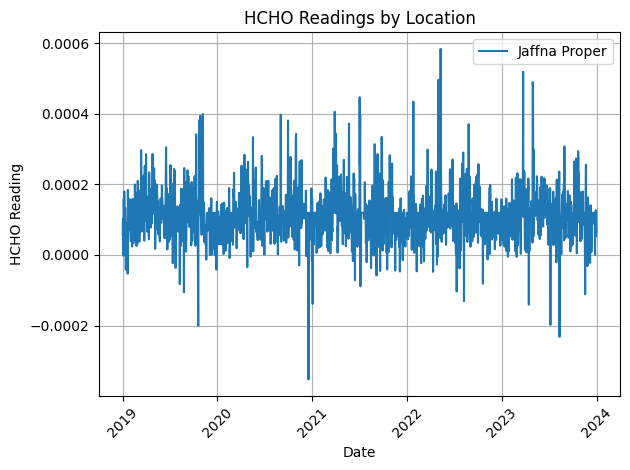

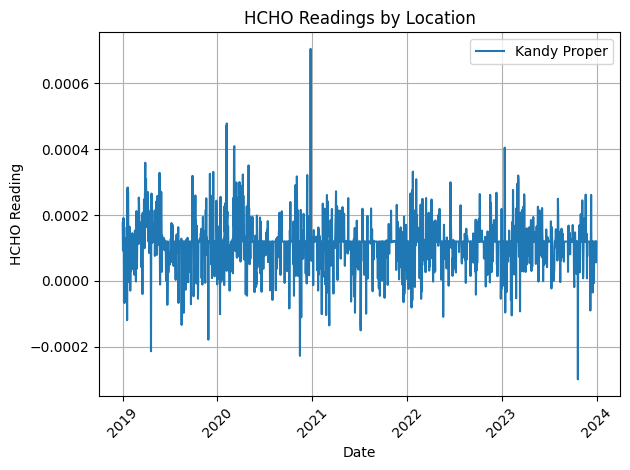

In [17]:
# Convert Spark DataFrame to Pandas DataFrame for plotting
df_pandas = df_spark.toPandas()

# Plot HCHO readings for each location
locations = df_pandas['Location'].unique()
for location in locations:
    data_location = df_pandas[df_pandas['Location'] == location]
    plt.plot(data_location['Current Date'], data_location['HCHO Reading'], label=location)

    # Customize plot
    plt.xlabel('Date')
    plt.ylabel('HCHO Reading')
    plt.title('HCHO Readings by Location')
    plt.legend()
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()

    # Show plot
    plt.show()

In [18]:
# Convert 'Current Date' column to datetime format
df_pandas['Current Date'] = pd.to_datetime(df_pandas['Current Date'])

# Extract month from 'Current Date' column
df_pandas['Month'] = df_pandas['Current Date'].dt.month

# Display the first few rows to verify the changes
print(df_pandas.head())

   HCHO Reading        Location Current Date   Next Date  Month
0      0.000197  Colombo Proper   2019-01-01  2019-01-02      1
1      0.000263  Colombo Proper   2019-01-02  2019-01-03      1
2      0.000099  Colombo Proper   2019-01-03  2019-01-04      1
3      0.000210  Colombo Proper   2019-01-04  2019-01-05      1
4      0.000179  Colombo Proper   2019-01-05  2019-01-06      1


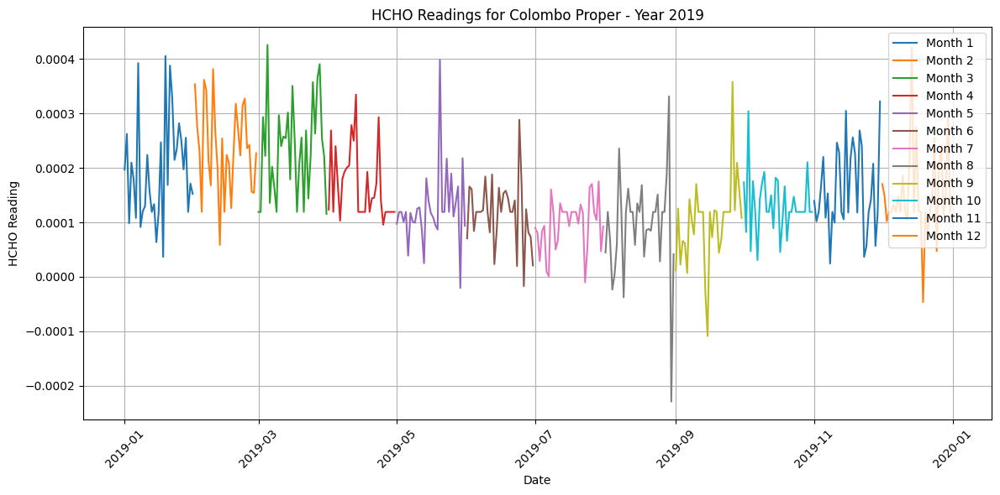

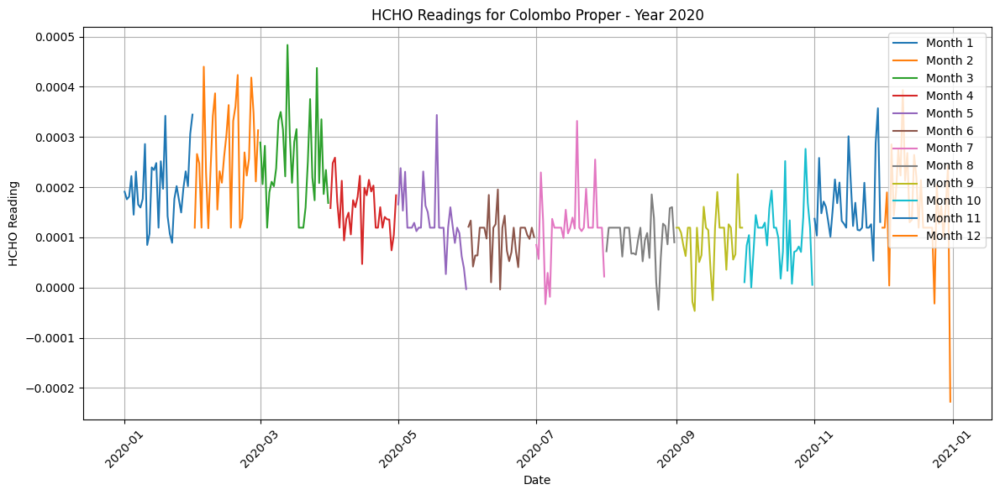

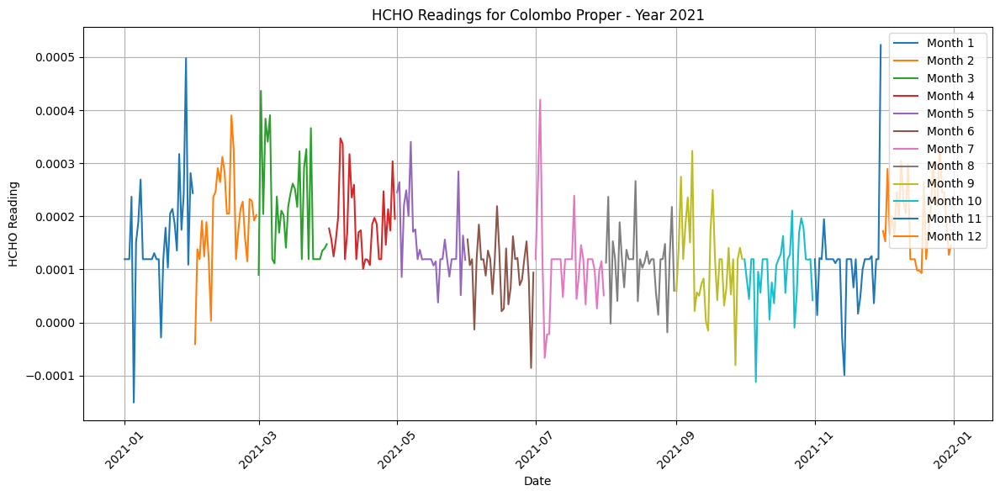

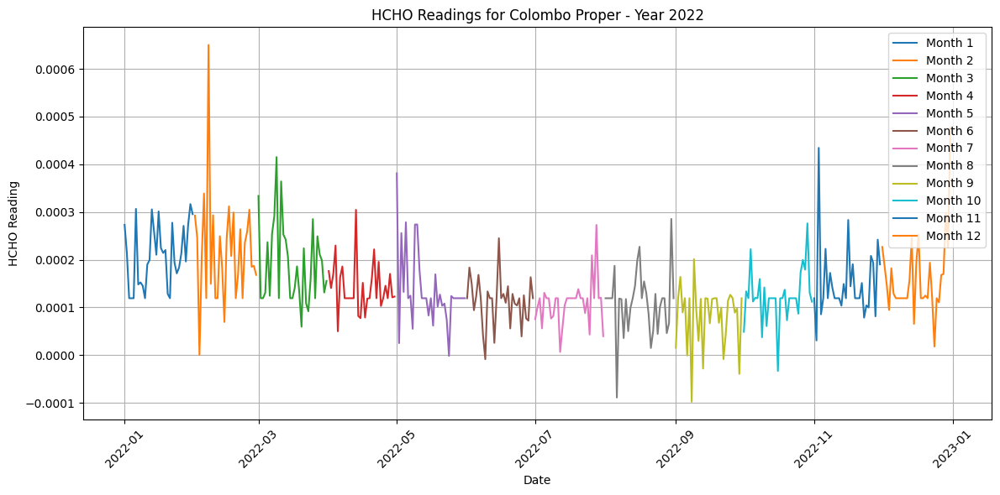

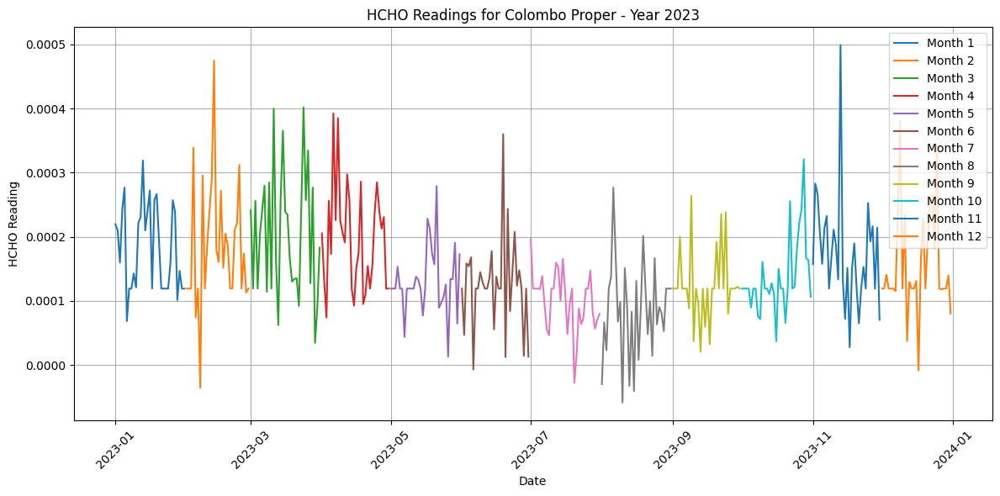

...

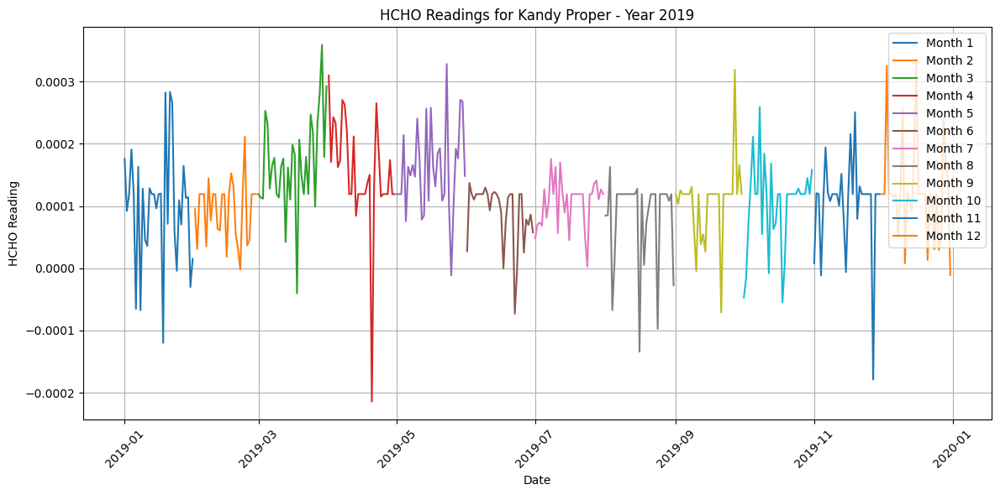

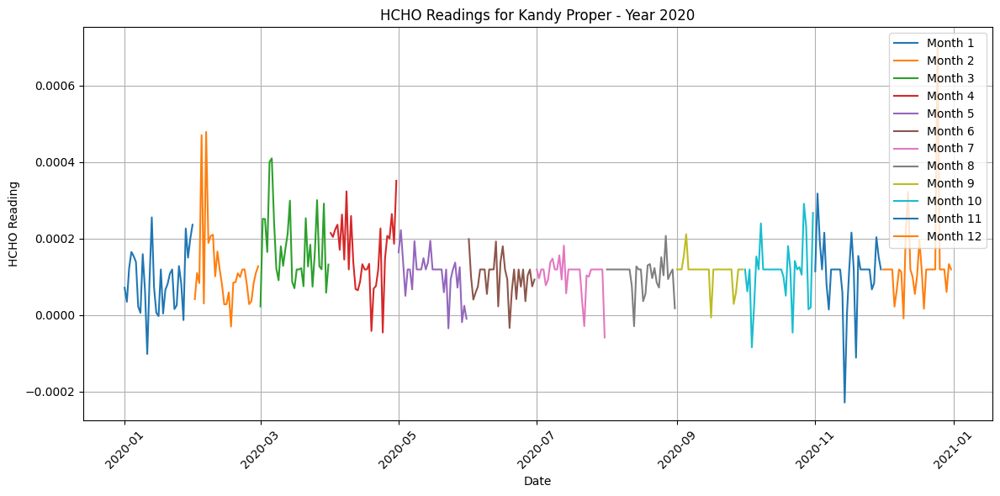

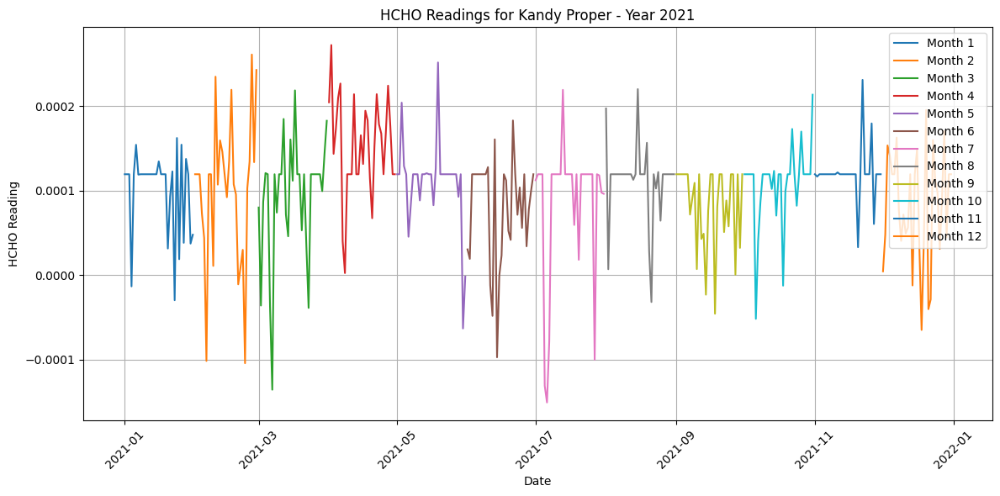

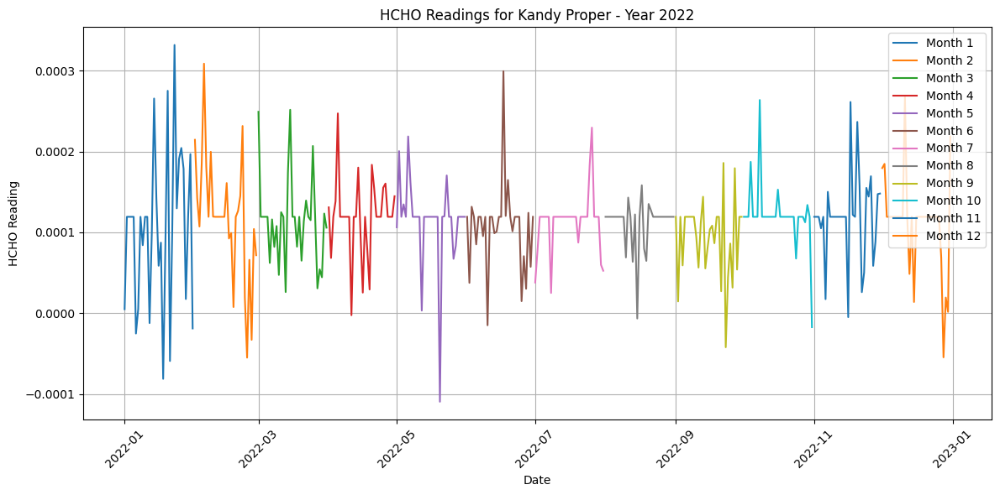

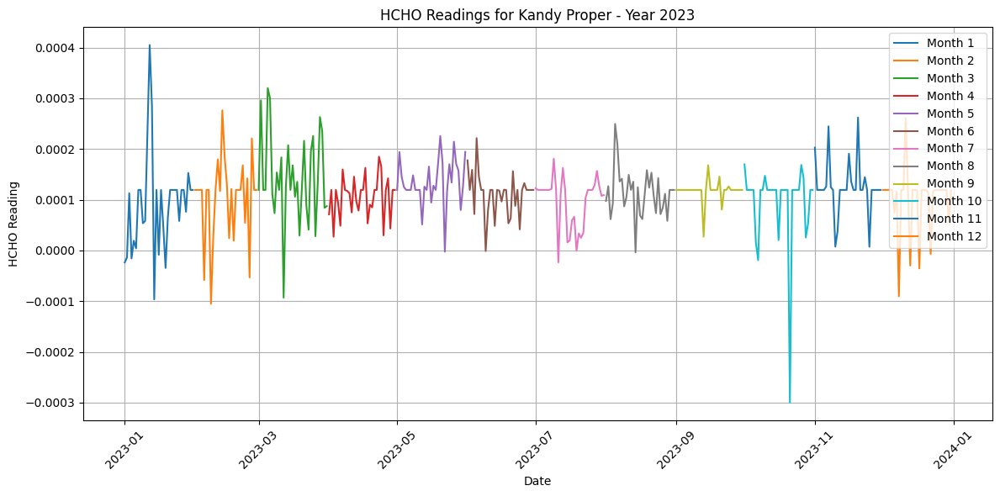

In [19]:
# Plot HCHO readings for each location and each month
locations = df_pandas['Location'].unique()
months = sorted(df_pandas['Month'].unique())
years = df_pandas['Current Date'].dt.year.unique()

for location in locations:
    for year in years:
        plt.figure(figsize=(12, 6))  # Set the width and height of the plot
        plt.title(f'HCHO Readings for {location} - Year {year}')  # Set the title of the plot

        for month in months:
            data_location_month_year = df_pandas[(df_pandas['Location'] == location) &
                                                  (df_pandas['Month'] == month) &
                                                  (df_pandas['Current Date'].dt.year == year)]
            if not data_location_month_year.empty:
                plt.plot(data_location_month_year['Current Date'], data_location_month_year['HCHO Reading'],
                         label=f"Month {month}")

        # Customize plot
        plt.xlabel('Date')
        plt.ylabel('HCHO Reading')
        plt.legend(loc='upper right')
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.tight_layout()

        # Show plot
        plt.show()


In [20]:
from pyspark.sql.functions import mean, col

# Calculate the mean HCHO reading for each location
mean_hcho_by_location = df_spark.groupBy('Location').agg(mean('HCHO Reading').alias('Mean HCHO Reading'))

# Rank locations based on mean HCHO reading (descending order)
ranked_locations = mean_hcho_by_location.orderBy(col('Mean HCHO Reading').desc())

# Show the ranked locations
ranked_locations.show()

+-------------------+--------------------+
|           Location|   Mean HCHO Reading|
+-------------------+--------------------+
|     Colombo Proper|1.480916996036323...|
|  Kurunegala Proper|1.292407039248092...|
| Bibile, Monaragala|1.237086665854354...|
|       Kandy Proper|1.119791209506632E-4|
|      Jaffna Proper|1.109013636756122...|
|Nuwara Eliya Proper|1.065550795445532...|
|   Deniyaya, Matara|1.044686072749091...|
+-------------------+--------------------+



###**Altitude ?**

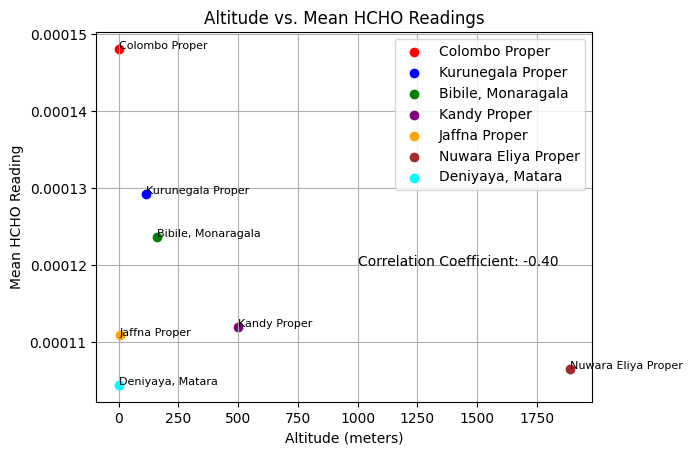

In [21]:
import numpy as np
import matplotlib.pyplot as plt

# Altitude data (in meters above sea level) for each location
location_altitude_meters = {
    "Colombo Proper": 1,
    "Kurunegala Proper": 116,
    "Bibile, Monaragala": 161,
    "Kandy Proper": 500,
    "Jaffna Proper": 5,
    "Nuwara Eliya Proper": 1889,
    "Deniyaya, Matara": 2
}

# Mean HCHO reading data for each location
mean_hcho_readings = {
    "Colombo Proper": 1.480916996036323e-4,
    "Kurunegala Proper": 1.292407039248092e-4,
    "Bibile, Monaragala": 1.237086665854354e-4,
    "Kandy Proper": 1.119791209506632e-4,
    "Jaffna Proper": 1.109013636756122e-4,
    "Nuwara Eliya Proper": 1.065550795445532e-4,
    "Deniyaya, Matara": 1.044686072749091e-4
}

# Convert dictionaries to arrays for easier computation
altitudes = np.array(list(location_altitude_meters.values()))
hcho_readings = np.array(list(mean_hcho_readings.values()))
cities = list(location_altitude_meters.keys())  # List of city names

# Calculate correlation coefficient between altitude and mean HCHO readings
correlation_coefficient = np.corrcoef(altitudes, hcho_readings)[0, 1]

# Define colors for each city
colors = ['red', 'blue', 'green', 'purple', 'orange', 'brown', 'cyan']

# Plot altitude vs. mean HCHO readings with labeled points
for i in range(len(altitudes)):
    plt.scatter(altitudes[i], hcho_readings[i], color=colors[i], label=cities[i])
    plt.text(altitudes[i], hcho_readings[i], cities[i], fontsize=8)

plt.title('Altitude vs. Mean HCHO Readings')
plt.xlabel('Altitude (meters)')
plt.ylabel('Mean HCHO Reading')
plt.grid(True)

# Add legend
plt.legend(loc='upper right')

# Add correlation coefficient to the plot
plt.text(1000, 1.2e-4, f'Correlation Coefficient: {correlation_coefficient:.2f}', fontsize=10, color='black')

# Show plot
plt.show()


###**Population Density ?**

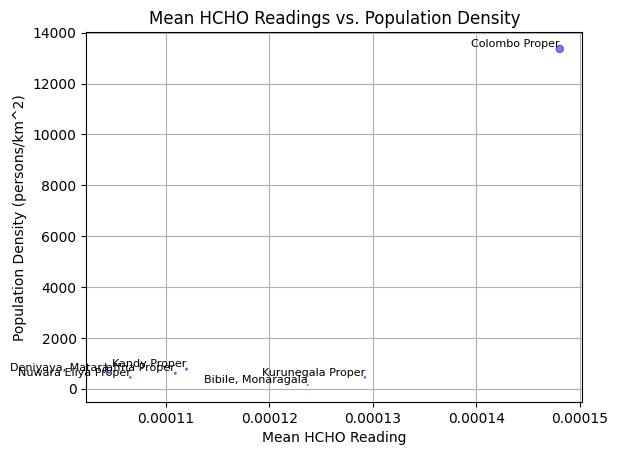

In [22]:
import numpy as np
import matplotlib.pyplot as plt

# Mean HCHO reading data for each location
mean_hcho_readings = {
    "Colombo Proper": 1.480916996036323e-4,
    "Kurunegala Proper": 1.292407039248092e-4,
    "Bibile, Monaragala": 1.237086665854354e-4,
    "Kandy Proper": 1.119791209506632e-4,
    "Jaffna Proper": 1.109013636756122e-4,
    "Nuwara Eliya Proper": 1.065550795445532e-4,
    "Deniyaya, Matara": 1.044686072749091e-4
}

# Population density data for each location (persons per square kilometer)
population_density = {
    "Colombo Proper": 13364,
    "Kurunegala Proper": 448.02,
    "Bibile, Monaragala": 152,
    "Kandy Proper": 773.2,
    "Jaffna Proper": 610.73,
    "Nuwara Eliya Proper": 448.02,
    "Deniyaya, Matara": 634.59
}

# Convert dictionaries to arrays for easier computation
hcho_readings = np.array(list(mean_hcho_readings.values()))
population_densities = np.array(list(population_density.values()))
cities = list(mean_hcho_readings.keys())  # List of city names

# Define marker sizes based on population density
marker_sizes = population_densities / 500  # Adjust scale for better visualization

# Plot mean HCHO readings vs. population density with marker size
plt.scatter(hcho_readings, population_densities, s=marker_sizes, c='blue', alpha=0.5)

# Display city names separately
for i, city in enumerate(cities):
    plt.text(hcho_readings[i], population_densities[i], city, fontsize=8, ha='right', va='bottom')

plt.title('Mean HCHO Readings vs. Population Density')
plt.xlabel('Mean HCHO Reading')
plt.ylabel('Population Density (persons/km^2)')
plt.grid(True)

# Show plot
plt.show()


#**3. Model Development**

In [26]:
df_pandas = df_spark.toPandas()
columns_list = df_pandas.columns
print(columns_list)

Index(['HCHO Reading', 'Location', 'Current Date', 'Next Date'], dtype='object')


<Axes: >

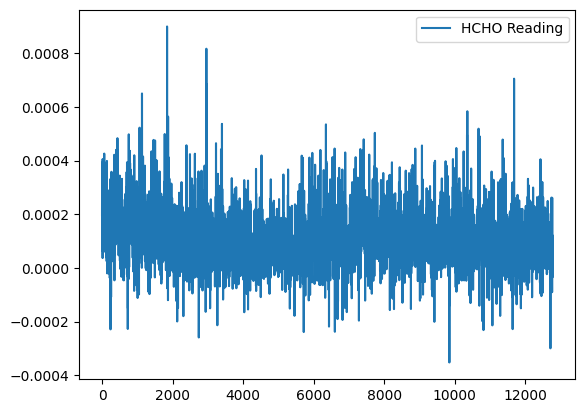

In [27]:
df_pandas.plot()

In [28]:
from statsmodels.tsa.stattools import adfuller

test_result=adfuller(df_pandas['HCHO Reading'])

def adfuller_test(HCHO_Reading):

    result=adfuller(HCHO_Reading)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']

    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")


In [29]:
adfuller_test(df_pandas['HCHO Reading'])

ADF Test Statistic : -10.4146574325783
p-value : 1.767235628435525e-18
#Lags Used : 34
Number of Observations Used : 12747
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


In [30]:
df_pandas['HCHO Reading Difference'] = df_pandas['HCHO Reading'] - df_pandas['HCHO Reading'].shift(1)
df_pandas['HCHO Reading'].shift(1)

0             NaN
1        0.000197
2        0.000263
3        0.000099
4        0.000210
           ...   
12777    0.000119
12778    0.000119
12779    0.000119
12780    0.000119
12781    0.000056
Name: HCHO Reading, Length: 12782, dtype: float64

In [31]:
df_pandas['HCHO Reading Difference'] = df_pandas['HCHO Reading'] - df_pandas['HCHO Reading'].shift(12)

In [32]:
df_pandas.head()

,HCHO Reading,Location,Current Date,Next Date,HCHO Reading Difference
0,0.000197,Colombo Proper,2019-01-01,2019-01-02,NaN
1,0.000263,Colombo Proper,2019-01-02,2019-01-03,NaN
2,0.000099,Colombo Proper,2019-01-03,2019-01-04,NaN
3,0.000210,Colombo Proper,2019-01-04,2019-01-05,NaN
4,0.000179,Colombo Proper,2019-01-05,2019-01-06,NaN


In [33]:
adfuller_test(df_pandas['HCHO Reading Difference'].dropna())

ADF Test Statistic : -23.597615414388653
p-value : 0.0
#Lags Used : 39
Number of Observations Used : 12730
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


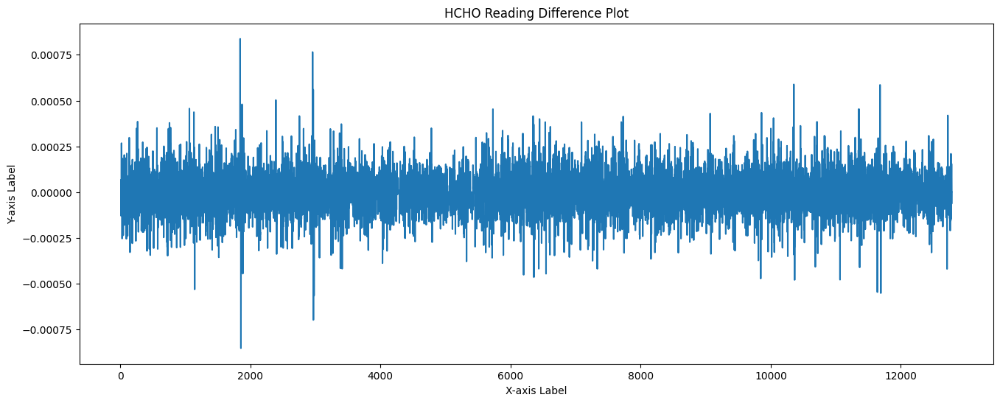

In [34]:
# Increase the width of the plot
plt.figure(figsize=(16, 6))  # Adjust the width and height as needed
df_pandas['HCHO Reading Difference'].plot()

# Optionally, add titles and labels
plt.title('HCHO Reading Difference Plot')
plt.xlabel('X-axis Label')
plt.ylabel('Y-axis Label')

# Show the plot
plt.show()

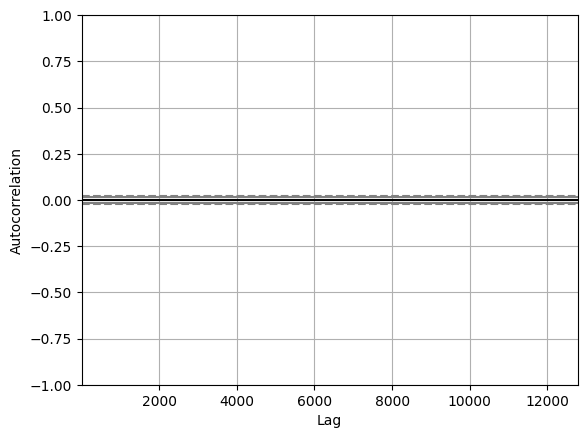

In [35]:
from pandas.plotting import autocorrelation_plot

# Plot the autocorrelation plot
autocorrelation_plot(df_pandas['HCHO Reading Difference'])
plt.show()


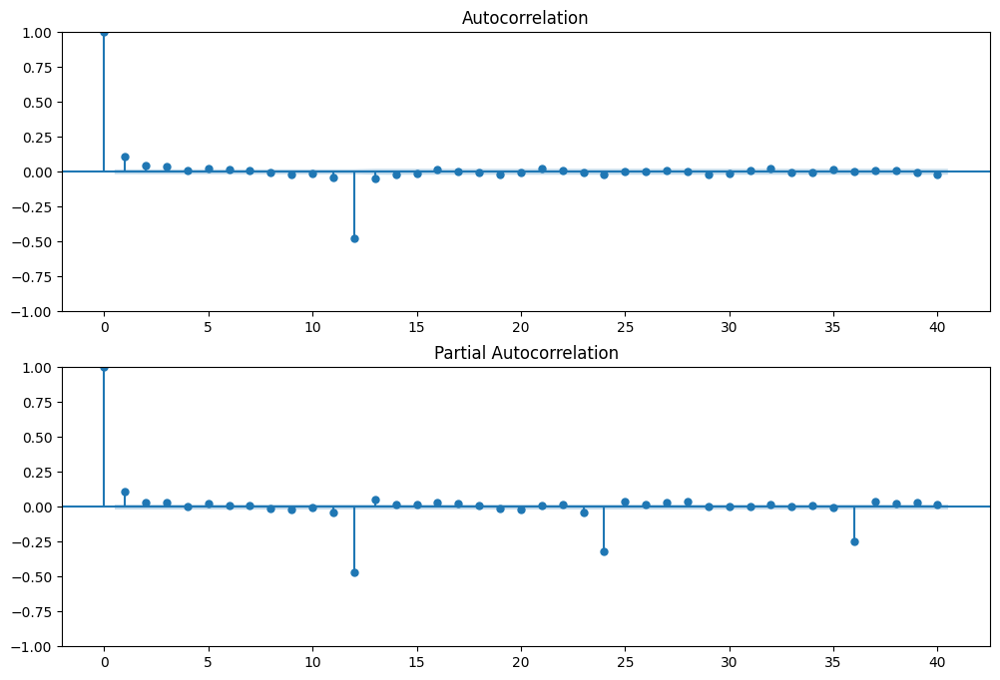

In [36]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
import statsmodels.api as sm

fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_pandas['HCHO Reading Difference'].iloc[13:],lags=40,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_pandas['HCHO Reading Difference'].iloc[13:],lags=40,ax=ax2)

In [37]:
# For non-seasonal data
#p=1, d=1, q=0 or 1
from statsmodels.tsa.arima.model import ARIMA

model=ARIMA(df_pandas['HCHO Reading'],order=(1,1,1))
model_fit=model.fit()

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tools/numdiff.py:251: RuntimeWarning: overflow encountered in divide
  partials = [f(x+ih, *args, **kwargs).imag / epsilon[i]


In [38]:
model_fit.summary()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1384: RuntimeWarning: overflow encountered in square
  squared_resid = np.asarray(resid, dtype=float) ** 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py:3158: UserWarning: Early subset of data for variable 0 has too few non-missing observations to calculate test statistic.
  test_statistic, p_value = breakvar_heteroskedasticity_test(
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1088: RuntimeWarning: overflow encountered in square
  s = a_zero_mean**2
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1092: RuntimeWarning: overflow encountered in square
  s = s**2
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:           HCHO Reading   No. Observations:                12782
Model:                 ARIMA(1, 1, 1)   Log Likelihood                     nan
Date:                Sun, 21 Apr 2024   AIC                                nan
Time:                        10:23:46   BIC                                nan
Sample:                             0   HQIC                               nan
                              - 12782                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0465        nan        nan        nan         nan         nan
ma.L1         -0.7374        nan        nan        nan         nan         nan
sigma2      4.956e-12        nan        nan        nan         nan         nan
===================================================================================
Ljung-Box (L1) (Q):                    nan   Jarque-Bera (JB):                  nan
Prob(Q):                               nan   Prob(JB):                          nan
Heteroskedasticity (H):                nan   Skew:                              nan
Prob(H) (two-sided):                   nan   Kurtosis:                          nan
===================================================================================

Warnings:
[1] Covariance matrix is singular or near-singular, with condition number    nan. Standard errors may be unstable.
"""

<Axes: >

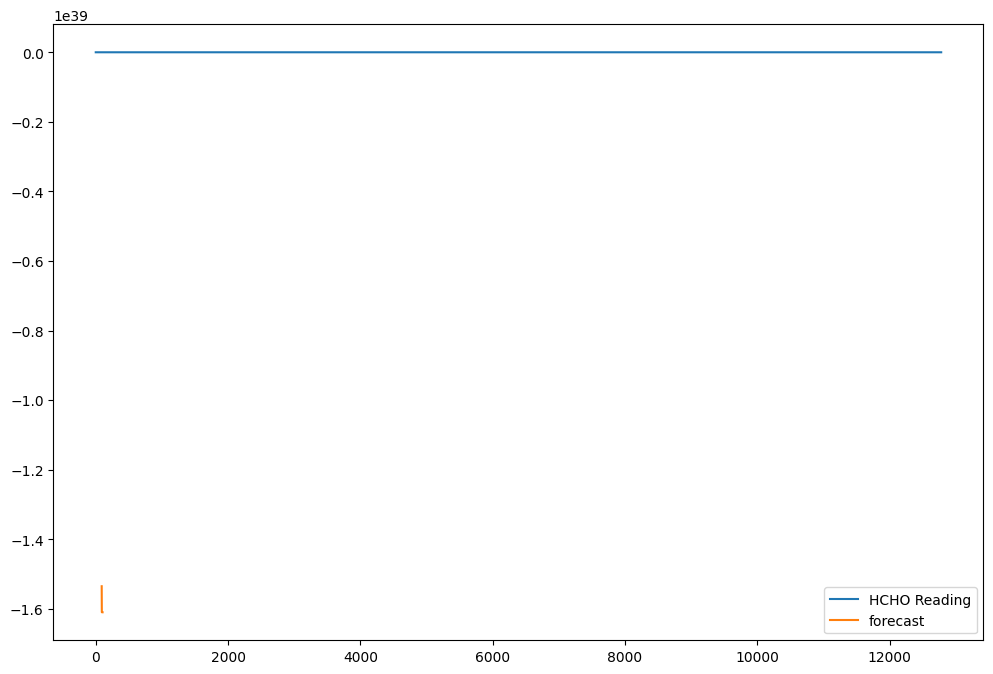

In [39]:
df_pandas['forecast']=model_fit.predict(start=90,end=103,dynamic=True)
df_pandas[['HCHO Reading','forecast']].plot(figsize=(12,8))

In [40]:
model=sm.tsa.statespace.SARIMAX(df_pandas['HCHO Reading'],order=(1, 1, 1),seasonal_order=(1,1,1,12))
results=model.fit()

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Axes: >

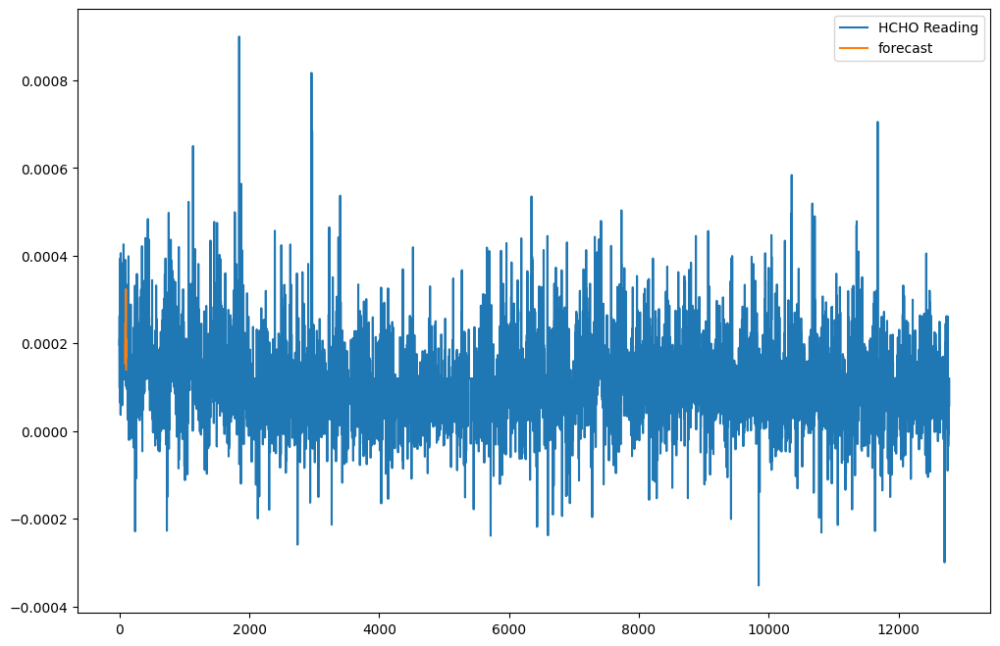

In [41]:

df_pandas['forecast']=results.predict(start=90,end=103,dynamic=True)
df_pandas[['HCHO Reading','forecast']].plot(figsize=(12,8))

In [42]:
# Convert 'Month' column to datetime if not already
df_pandas['Current Date'] = pd.to_datetime(df_pandas['Current Date'])

# Set 'Month' as the index of the DataFrame
df_pandas.set_index('Current Date', inplace=True)


from pandas.tseries.offsets import DateOffset

# Ensure the index is indeed a DatetimeIndex
if isinstance(df_pandas.index, pd.DatetimeIndex):
    future_dates = [df_pandas.index[-1] + DateOffset(months=x) for x in range(0, 24)]
else:
    print("The index is not a datetime type.")


In [43]:
from pandas.tseries.offsets import DateOffset
future_dates=[df_pandas.index[-1]+ DateOffset(months=x)for x in range(0,24)]

In [44]:
future_datest_df = pd.DataFrame(index=future_dates[1:],columns=df_pandas.columns)

In [45]:
future_datest_df=pd.DataFrame(index=future_dates[1:],columns=df_pandas.columns)

In [46]:
future_datest_df.tail()

,HCHO Reading,Location,Next Date,HCHO Reading Difference,forecast
2025-07-31,NaN,NaN,NaN,NaN,NaN
2025-08-31,NaN,NaN,NaN,NaN,NaN
2025-09-30,NaN,NaN,NaN,NaN,NaN
2025-10-31,NaN,NaN,NaN,NaN,NaN
2025-11-30,NaN,NaN,NaN,NaN,NaN


In [47]:
future_df=pd.concat([df_pandas,future_datest_df])

<Axes: >

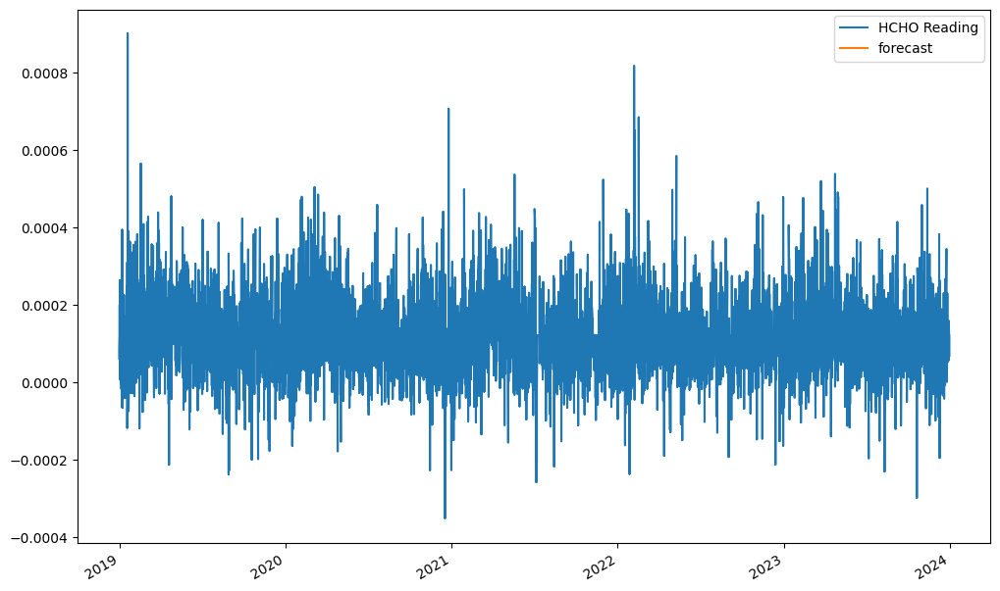

In [48]:
future_df['forecast'] = results.predict(start = 104, end = 120, dynamic= True)
future_df[['HCHO Reading', 'forecast']].plot(figsize=(12, 8))

In [49]:
!pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 6.7 MB/s eta 0:00:00


In [50]:
!pip install pmdarima
from pmdarima import auto_arima
import pandas as pd

# Assuming 'df_pandas' is your pre-processed DataFrame with a datetime index
# and 'HCHO Reading' is the target column.

model = auto_arima(df_pandas['HCHO Reading'], seasonal=True, m=12, trace=True,
                   error_action='ignore', suppress_warnings=True)

print(model.summary())

# Forecasting
forecast, conf_int = model.predict(n_periods=24, return_conf_int=True)  # Adjust 'n_periods' as needed

# Optionally plot
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(df_pandas['HCHO Reading'], label='Observed')
plt.plot(pd.date_range(df_pandas.index[-1], periods=24, freq='M'), forecast, label='Forecast')
plt.fill_between(pd.date_range(df_pandas.index[-1], periods=24, freq='M'), conf_int[:, 0], conf_int[:, 1], color='red', alpha=0.3)
plt.title('Forecast vs Actuals')
plt.legend()
plt.show()


Performing stepwise search to minimize aic


KeyboardInterrupt: 

In [ ]:
!pip install pmdarima
from pmdarima import auto_arima
import pandas as pd

# Assuming 'df_pandas' is your pre-processed DataFrame with a datetime index
# and 'HCHO Reading' is the target column.

model = auto_arima(df_pandas['HCHO Reading'], seasonal=True, m=12, trace=True,
                   error_action='ignore', suppress_warnings=True)

print(model.summary())

# Forecasting
forecast, conf_int = model.predict(n_periods=24, return_conf_int=True)  # Adjust 'n_periods' as needed

# Optionally plot
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(df_pandas['HCHO Reading'], label='Observed')
plt.plot(pd.date_range(df_pandas.index[-1], periods=24, freq='M'), forecast, label='Forecast')
plt.fill_between(pd.date_range(df_pandas.index[-1], periods=24, freq='M'), conf_int[:, 0], conf_int[:, 1], color='red', alpha=0.3)
plt.title('Forecast vs Actuals')+
plt.legend()
plt.show()


Index(['HCHO Reading', 'Location', 'Current Date', 'Next Date'], dtype='object')


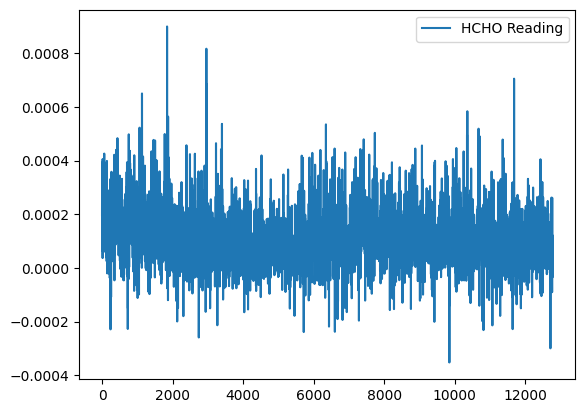

ADF Test Statistic : -10.4146574325783
p-value : 1.767235628435525e-18
#Lags Used : 34
Number of Observations Used : 12747
strong evidence against the null hypothesis (Ho), reject the null hypothesis. Data has no unit root and is stationary
ADF Test Statistic : -26.87330115556008
p-value : 0.0
#Lags Used : 41
Number of Observations Used : 12728
strong evidence against the null hypothesis (Ho), reject the null hypothesis. Data has no unit root and is stationary


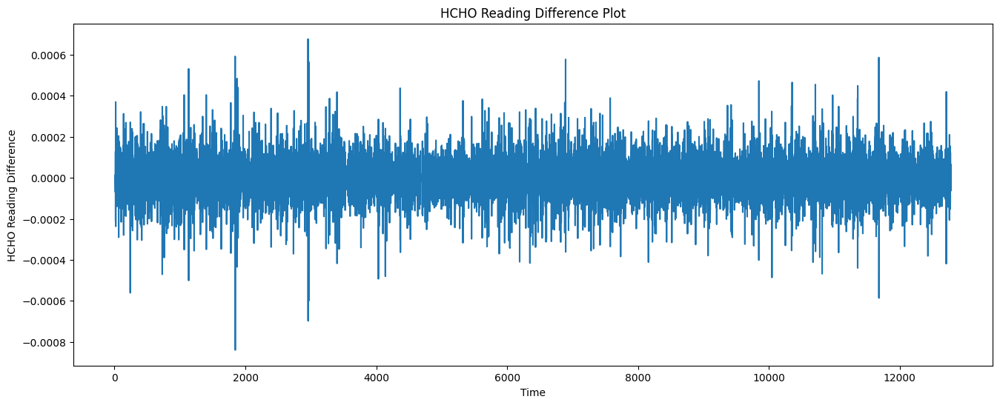

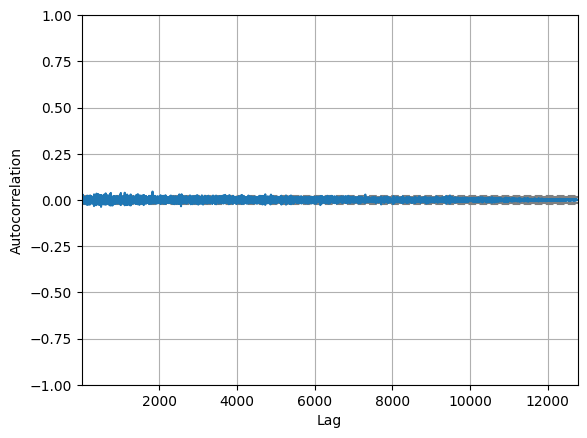

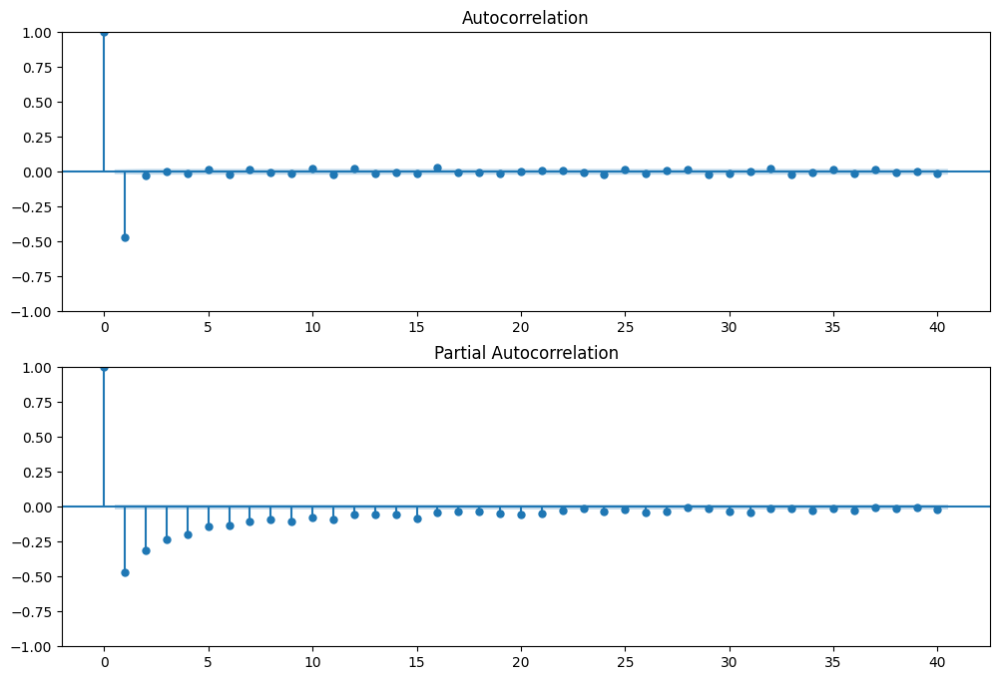

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tools/numdiff.py:251: RuntimeWarning: overflow encountered in divide
  partials = [f(x+ih, *args, **kwargs).imag / epsil

                               SARIMAX Results                                
Dep. Variable:           HCHO Reading   No. Observations:                12770
Model:                 ARIMA(1, 1, 1)   Log Likelihood                     nan
Date:                Sun, 21 Apr 2024   AIC                                nan
Time:                        10:58:26   BIC                                nan
Sample:                             0   HQIC                               nan
                              - 12770                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0472        nan        nan        nan         nan         nan
ma.L1         -0.7377        nan        nan        nan         nan         nan
sigma2      4.736e-12        nan        nan        n

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                                     SARIMAX Results                                      
Dep. Variable:                       HCHO Reading   No. Observations:                12770
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood              101753.910
Date:                            Sun, 21 Apr 2024   AIC                        -203497.820
Time:                                    10:59:20   BIC                        -203460.551
Sample:                                         0   HQIC                       -203485.355
                                          - 12770                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0509   2.28e-20   2.23e+18      0.000       0.051       0.051
ma.L1         -0.7336   7.25e-20  -

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


<Figure size 1200x800 with 0 Axes>

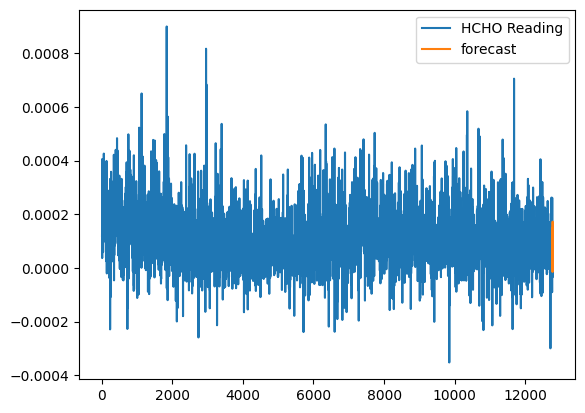

Performing stepwise search to minimize aic


KeyboardInterrupt: 

In [54]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima

# Assume df_spark is already defined
df_pandas = df_spark.toPandas()

# Print column names
print(df_pandas.columns)

# Plot DataFrame
df_pandas.plot()
plt.show()

# Perform Augmented Dickey-Fuller test
def adfuller_test(series):
    result = adfuller(series)
    labels = ['ADF Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used']
    for value, label in zip(result, labels):
        print(f'{label} : {value}')
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis (Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary")

adfuller_test(df_pandas['HCHO Reading'])

# Differencing the data
df_pandas['HCHO Reading Difference'] = df_pandas['HCHO Reading'] - df_pandas['HCHO Reading'].shift(1)
df_pandas['HCHO Reading Seasonal Difference'] = df_pandas['HCHO Reading'] - df_pandas['HCHO Reading'].shift(12)
df_pandas.dropna(inplace=True)

# Re-run ADF test on differenced data
adfuller_test(df_pandas['HCHO Reading Difference'])

# Plotting the differenced data
plt.figure(figsize=(16, 6))
df_pandas['HCHO Reading Difference'].plot()
plt.title('HCHO Reading Difference Plot')
plt.xlabel('Time')
plt.ylabel('HCHO Reading Difference')
plt.show()

# Autocorrelation plot
pd.plotting.autocorrelation_plot(df_pandas['HCHO Reading Difference'])
plt.show()

# ACF and PACF plots
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_pandas['HCHO Reading Difference'].iloc[13:], lags=40, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_pandas['HCHO Reading Difference'].iloc[13:], lags=40, ax=ax2)
plt.show()

# ARIMA model
model = ARIMA(df_pandas['HCHO Reading'], order=(1, 1, 1))
model_fit = model.fit()
print(model_fit.summary())

# SARIMAX model for seasonal data
model = sm.tsa.statespace.SARIMAX(df_pandas['HCHO Reading'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
results = model.fit()
print(results.summary())

# Forecasting
df_pandas['forecast'] = results.predict(start=len(df_pandas)-15, end=len(df_pandas)+10, dynamic=True)
plt.figure(figsize=(12, 8))
df_pandas[['HCHO Reading', 'forecast']].plot()
plt.show()

# Auto ARIMA model
model = auto_arima(df_pandas['HCHO Reading'], seasonal=True, m=12, trace=True, error_action='ignore', suppress_warnings=True)
print(model.summary())

# Future forecasting with correct date range
future_dates = pd.date_range(start=df_pandas.index[-1], periods=150, freq='M')  # Changed from 24 to 150 periods
forecast, conf_int = model.predict(n_periods=150, return_conf_int=True)  # Ensure 150 periods for forecasting

plt.figure(figsize=(10, 5))
plt.plot(df_pandas['HCHO Reading'], label='Observed')
plt.plot(future_dates, forecast, label='Forecast')
plt.fill_between(future_dates, conf_int[:, 0], conf_int[:, 1], color='red', alpha=0.3)
plt.title('Forecast vs Actuals')
plt.legend()
plt.show()


Index(['HCHO Reading', 'Location', 'Current Date', 'Next Date'], dtype='object')


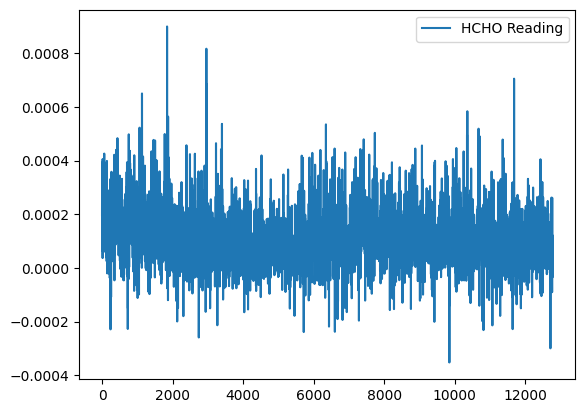

ADF Test Statistic : -10.4146574325783
p-value : 1.767235628435525e-18
#Lags Used : 34
Number of Observations Used : 12747
Strong evidence against the null hypothesis (Ho), reject the null hypothesis. Data has no unit root and is stationary
ADF Test Statistic : -26.87330115556008
p-value : 0.0
#Lags Used : 41
Number of Observations Used : 12728
Strong evidence against the null hypothesis (Ho), reject the null hypothesis. Data has no unit root and is stationary


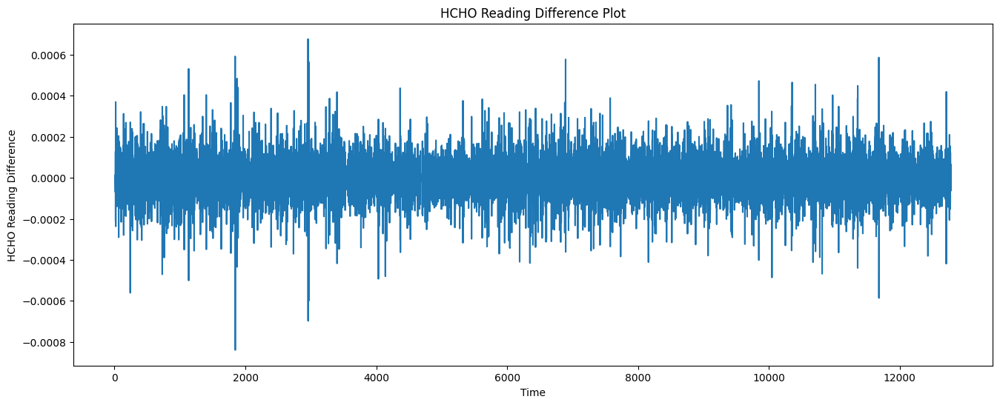

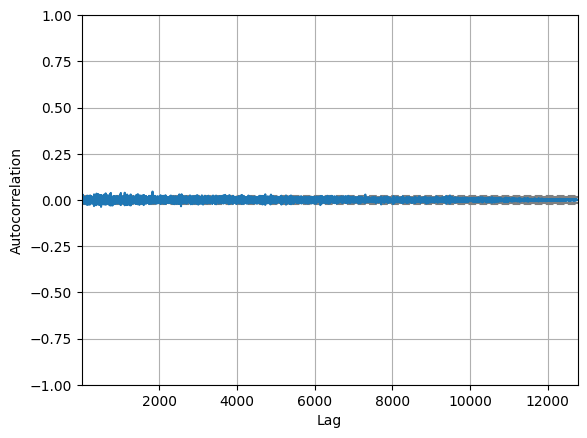

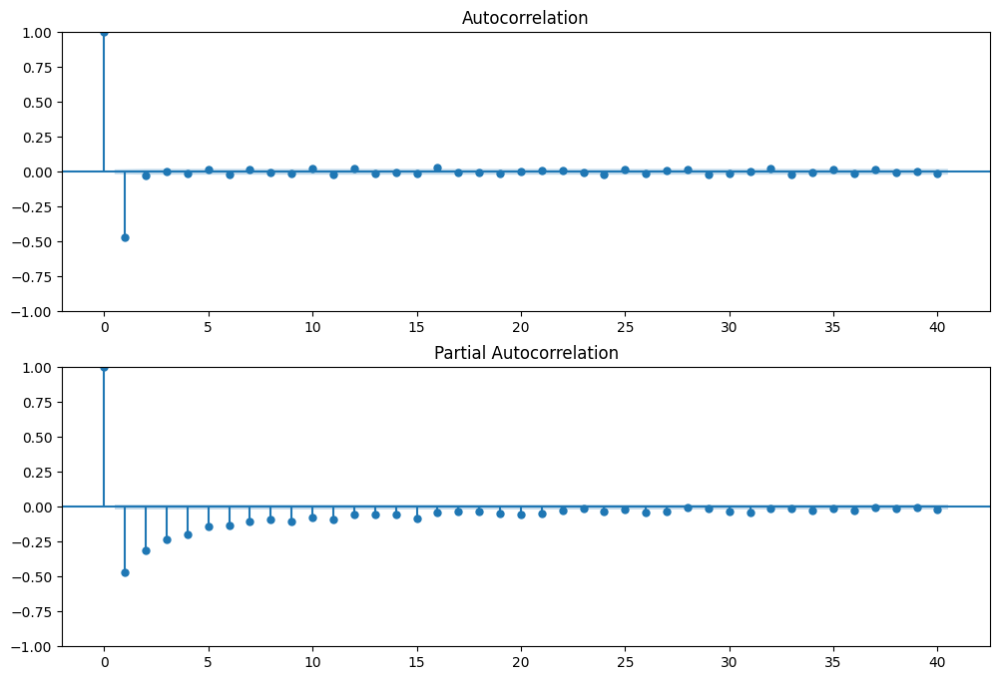

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tools/numdiff.py:251: RuntimeWarning: overflow encountered in divide
  partials = [f(x+ih, *args, **kwargs).imag / epsil

                               SARIMAX Results                                
Dep. Variable:           HCHO Reading   No. Observations:                12770
Model:                 ARIMA(1, 1, 1)   Log Likelihood                     nan
Date:                Sun, 21 Apr 2024   AIC                                nan
Time:                        11:03:17   BIC                                nan
Sample:                             0   HQIC                               nan
                              - 12770                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0472        nan        nan        nan         nan         nan
ma.L1         -0.7377        nan        nan        nan         nan         nan
sigma2      4.736e-12        nan        nan        n

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                                     SARIMAX Results                                      
Dep. Variable:                       HCHO Reading   No. Observations:                12770
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood              101753.910
Date:                            Sun, 21 Apr 2024   AIC                        -203497.820
Time:                                    11:04:07   BIC                        -203460.551
Sample:                                         0   HQIC                       -203485.355
                                          - 12770                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0509   2.28e-20   2.23e+18      0.000       0.051       0.051
ma.L1         -0.7336   7.25e-20  -

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


<Figure size 1200x800 with 0 Axes>

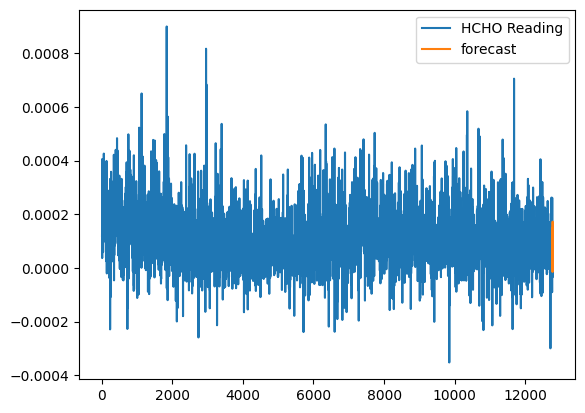

Performing stepwise search to minimize aic


KeyboardInterrupt: 

In [55]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from pandas.tseries.offsets import DateOffset
from pmdarima import auto_arima

# Assuming df_spark is your Spark DataFrame containing time series data
df_pandas = df_spark.toPandas()  # Convert Spark DataFrame to Pandas DataFrame for analysis

# Print the columns of the DataFrame to understand what data is available
print(df_pandas.columns)

# Plot the DataFrame to get a visual understanding of the data
df_pandas.plot()
plt.show()

# Define a function to perform Augmented Dickey-Fuller test for stationarity
def adfuller_test(series):
    result = adfuller(series)
    labels = ['ADF Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used']
    for value, label in zip(result, labels):
        print(f'{label} : {value}')
    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis (Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("Weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary")

# Perform ADF test on the 'HCHO Reading' column
adfuller_test(df_pandas['HCHO Reading'])

# Differencing the data to make it stationary if needed
df_pandas['HCHO Reading Difference'] = df_pandas['HCHO Reading'] - df_pandas['HCHO Reading'].shift(1)
df_pandas['HCHO Reading Seasonal Difference'] = df_pandas['HCHO Reading'] - df_pandas['HCHO Reading'].shift(12)
df_pandas.dropna(inplace=True)  # Drop NA values that result from differencing

# Re-run ADF test on the differenced data
adfuller_test(df_pandas['HCHO Reading Difference'])

# Plotting the differenced data
plt.figure(figsize=(16, 6))
df_pandas['HCHO Reading Difference'].plot()
plt.title('HCHO Reading Difference Plot')
plt.xlabel('Time')
plt.ylabel('HCHO Reading Difference')
plt.show()

# Plot autocorrelation to identify any autocorrelation in differenced data
pd.plotting.autocorrelation_plot(df_pandas['HCHO Reading Difference'])
plt.show()

# Plot ACF and PACF for the differenced data to help in ARIMA modeling
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_pandas['HCHO Reading Difference'].iloc[13:], lags=40, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_pandas['HCHO Reading Difference'].iloc[13:], lags=40, ax=ax2)
plt.show()

# Fit an ARIMA model on the original readings
model = ARIMA(df_pandas['HCHO Reading'], order=(1, 1, 1))
model_fit = model.fit()
print(model_fit.summary())

# Fit a SARIMAX model considering seasonal effects
model = sm.tsa.statespace.SARIMAX(df_pandas['HCHO Reading'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
results = model.fit()
print(results.summary())

# Forecast using the SARIMAX model results
df_pandas['forecast'] = results.predict(start=len(df_pandas)-15, end=len(df_pandas)+10, dynamic=True)
plt.figure(figsize=(12, 8))
df_pandas[['HCHO Reading', 'forecast']].plot()
plt.show()

# Fit an auto ARIMA model to automatically select the best ARIMA parameters
model = auto_arima(df_pandas['HCHO Reading'], seasonal=True, m=12, trace=True, error_action='ignore', suppress_warnings=True, stepwise=True)
print(model.summary())

# Future forecasting with correct date range for 150 months ahead
future_dates = pd.date_range(start=df_pandas.index[-1], periods=150, freq='M')  # Ensure the frequency matches the expected forecast interval
forecast, conf_int = model.predict(n_periods=150, return_conf_int=True)

plt.figure(figsize=(10, 5))
plt.plot(df_pandas['HCHO Reading'], label='Observed')
plt.plot(future_dates, forecast, label='Forecast')
plt.fill_between(future_dates, conf_int[:, 0], conf_int[:, 1], color='red', alpha=0.3)
plt.title('Forecast vs Actuals')
plt.legend()
plt.show()


In [57]:
print(df_pandas.index[-1])  # Last date of actual data
print(future_dates[0])  # First date of forecast
print(df_pandas.index)


12781
2023-12-31 00:00:00
Index([   12,    13,    14,    15,    16,    17,    18,    19,    20,    21,
       ...
       12772, 12773, 12774, 12775, 12776, 12777, 12778, 12779, 12780, 12781],
      dtype='int64', length=12770)


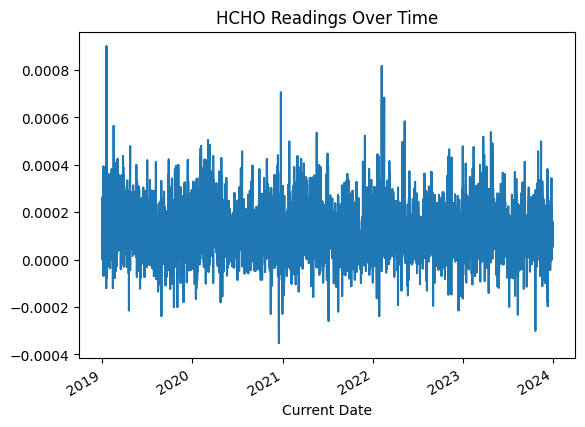

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsm

                               SARIMAX Results                                
Dep. Variable:           HCHO Reading   No. Observations:                12782
Model:                 ARIMA(1, 1, 1)   Log Likelihood                     nan
Date:                Sun, 21 Apr 2024   AIC                                nan
Time:                        11:17:15   BIC                                nan
Sample:                             0   HQIC                               nan
                              - 12782                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0465        nan        nan        nan         nan         nan
ma.L1         -0.7374        nan        nan        nan         nan         nan
sigma2      4.956e-12        nan        nan        n

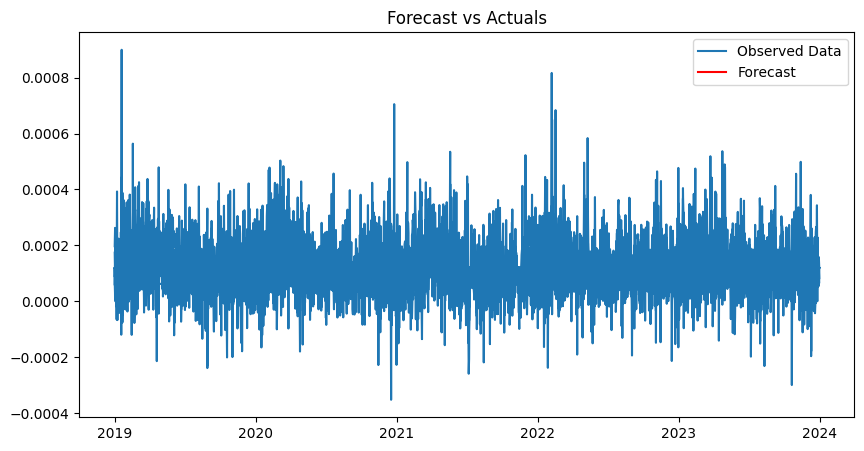

In [64]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller

# Assuming df_spark is your Spark DataFrame containing time series data
df_pandas = df_spark.toPandas()

# Set 'Current Date' as your index
df_pandas['Current Date'] = pd.to_datetime(df_pandas['Current Date'])
df_pandas.set_index('Current Date', inplace=True)

# Plot initial data
df_pandas['HCHO Reading'].plot(title='HCHO Readings Over Time')
plt.show()

# Augmented Dickey-Fuller Test to check stationarity
def adfuller_test(series):
    result = adfuller(series, autolag='AIC')
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]}')
    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("Weak evidence against the null hypothesis, time series has a unit root, indicating it is non-stationary")
    return result[1]  # Return the p-value

# Fit ARIMA model
model = ARIMA(df_pandas['HCHO Reading'], order=(1,1,1))
model_fit = model.fit()

# Print model summary
print(model_fit.summary())

# Forecasting
num_forecast_steps = 5  # Number of months to forecast
last_obs_date = df_pandas.index[-1]  # Get the last date from the index
forecast_start_date = last_obs_date + pd.DateOffset(months=1)  # Start forecasting the next month after the dataset ends
forecast = model_fit.get_forecast(steps=num_forecast_steps)
forecast_index = pd.date_range(start=forecast_start_date, periods=num_forecast_steps, freq='M')
forecast_series = pd.Series(forecast.predicted_mean, index=forecast_index)
confidence_intervals = forecast.conf_int()

# Plotting the results
plt.figure(figsize=(10, 5))
plt.plot(df_pandas['HCHO Reading'], label='Observed Data')
plt.plot(forecast_series, color='red', label='Forecast')
plt.fill_between(forecast_index,
                 confidence_intervals.iloc[:, 0],
                 confidence_intervals.iloc[:, 1], color='pink', alpha=0.3)
plt.title('Forecast vs Actuals')
plt.legend()
plt.show()


Processing Bibile, Monaragala...
Forecast for Bibile, Monaragala done.


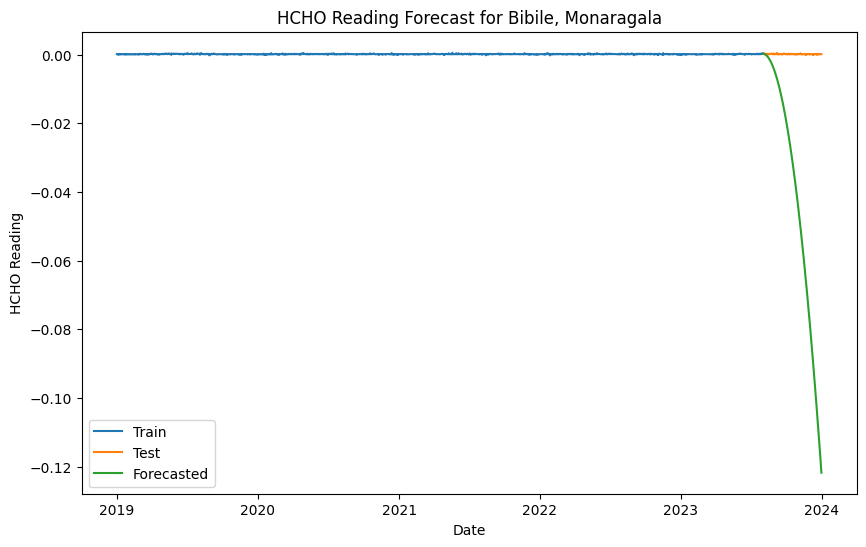

Processing Colombo Proper...
Forecast for Colombo Proper done.


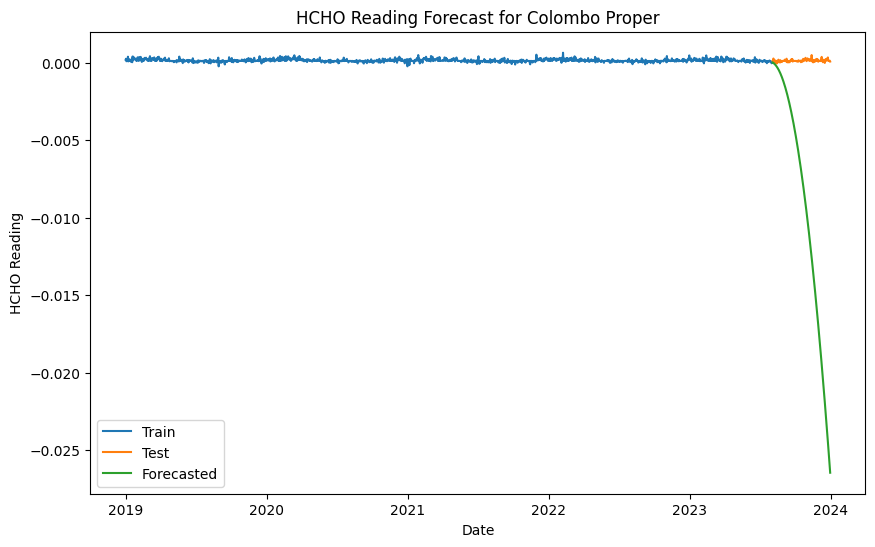

Processing Deniyaya, Matara...
Forecast for Deniyaya, Matara done.


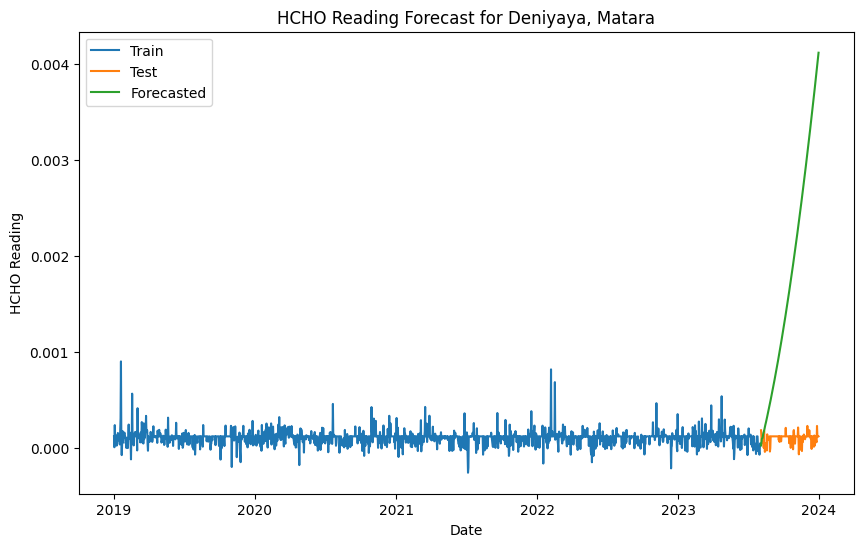

Processing Jaffna Proper...
Forecast for Jaffna Proper done.


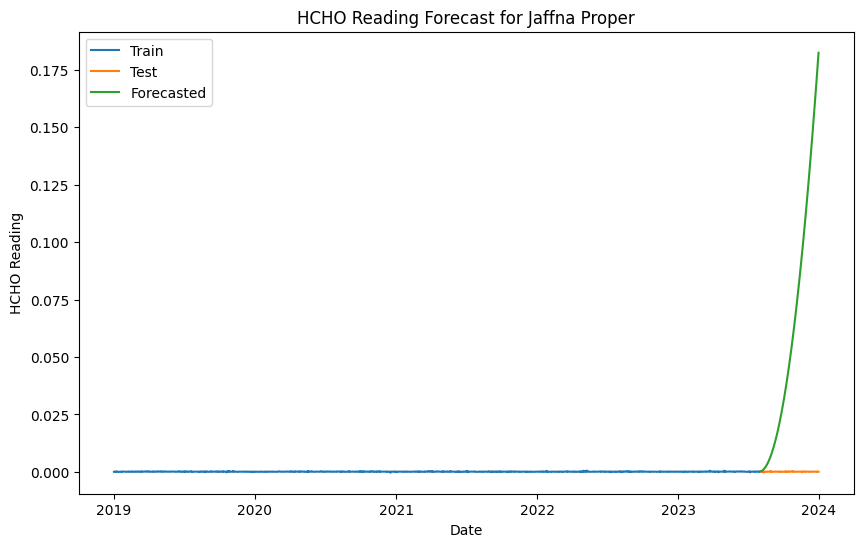

Processing Kandy Proper...
Forecast for Kandy Proper done.


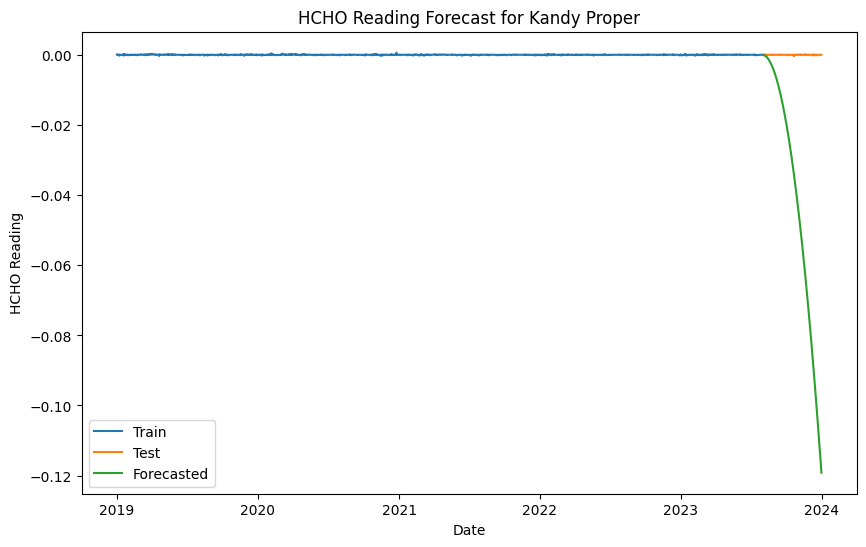

Processing Kurunegala Proper...
Forecast for Kurunegala Proper done.


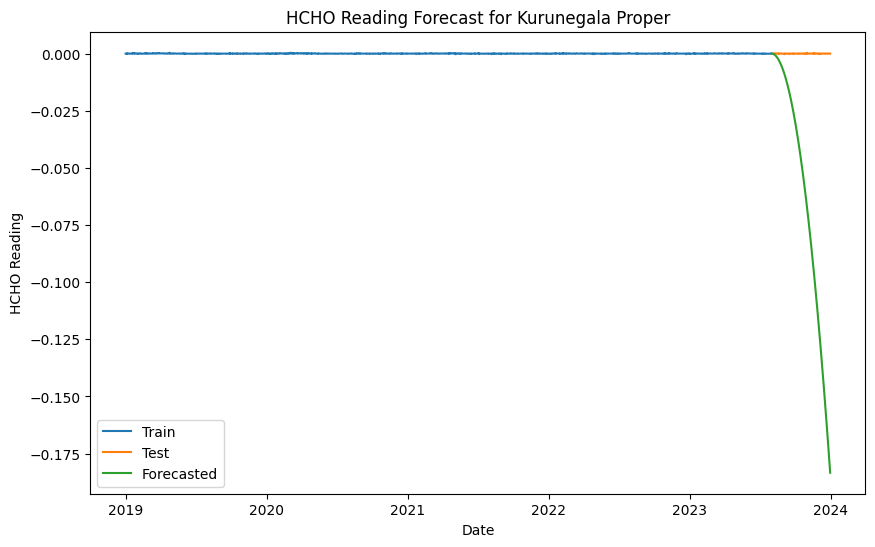

Processing Nuwara Eliya Proper...
Forecast for Nuwara Eliya Proper done.


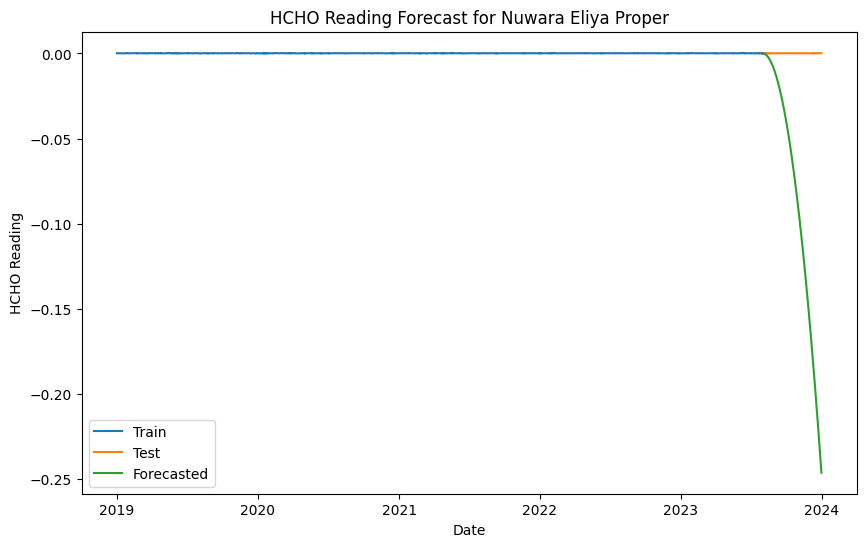

            Bibile, Monaragala  Colombo Proper  Deniyaya, Matara  \
2023-08-04            0.000238        0.000022          0.000025   
2023-08-05            0.000150       -0.000013          0.000061   
2023-08-06            0.000110       -0.000020          0.000095   
2023-08-07            0.000051       -0.000028          0.000098   
2023-08-08           -0.000010       -0.000057          0.000103   
...                        ...             ...               ...   
2023-12-27           -0.115425       -0.025108          0.003962   
2023-12-28           -0.116990       -0.025442          0.003999   
2023-12-29           -0.118565       -0.025779          0.004037   
2023-12-30           -0.120151       -0.026119          0.004075   
2023-12-31           -0.121748       -0.026460          0.004114   

            Jaffna Proper  Kandy Proper  Kurunegala Proper  \
2023-08-04       0.000296      0.000036           0.000049   
2023-08-05       0.000398     -0.000020           0.000026 

In [75]:
from statsmodels.tsa.arima.model import ARIMA
from pyspark.sql.functions import col

import warnings
warnings.filterwarnings("ignore")



# Assuming df_spark is your PySpark DataFrame
# Convert PySpark DataFrame to Pandas DataFrame
df_pandas = df_spark.select('Location', 'Current Date', 'HCHO Reading') \
                .orderBy('Location', 'Current Date') \
                .toPandas()

# Convert 'Current Date' to datetime and sort
df_pandas['Current Date'] = pd.to_datetime(df_pandas['Current Date'])
df_pandas.sort_values(by=['Location', 'Current Date'], inplace=True)

# Handle missing data if necessary
df_pandas['HCHO Reading'] = df_pandas.groupby('Location')['HCHO Reading'].transform(lambda x: x.fillna(method='ffill'))

# Set up ARIMA modeling
results = {}
for location in df_pandas['Location'].unique():
    print(f"Processing {location}...")
    # Filter data for the location
    loc_data = df_pandas[df_pandas['Location'] == location]
    loc_data.set_index('Current Date', inplace=True)
    loc_data.index = pd.DatetimeIndex(loc_data.index)

    # Optionally split data into training and test sets here
    train_data = loc_data if len(loc_data) <= 150 else loc_data.iloc[:-150]
    test_data = loc_data.iloc[-150:] if len(loc_data) > 150 else None

    # Check if enough data to fit model
    if len(train_data) < 30:
        print(f"Not enough data to fit ARIMA for {location}")
        continue

    # Fit ARIMA model (p, d, q values may need to be adjusted based on ACF/PACF analysis)
    try:
        model = ARIMA(train_data['HCHO Reading'], order=(4, 3, 4))  # Example order, modify as necessary
        fitted_model = model.fit()
        # Forecast the next 150 days (approximately 5 months)
        forecast = fitted_model.forecast(steps=150)
        results[location] = forecast
        print(f"Forecast for {location} done.")

        # Visualization for each location
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['HCHO Reading'], label='Train')
        if test_data is not None:
            plt.plot(test_data['HCHO Reading'], label='Test')
            plt.plot(test_data.index, forecast, label='Forecasted')
        plt.title(f'HCHO Reading Forecast for {location}')
        plt.xlabel('Date')
        plt.ylabel('HCHO Reading')
        plt.legend()
        plt.show()

    except Exception as e:
        print(f"Failed to fit ARIMA for {location}: {e}")

# If needed, convert results to a DataFrame or similar structure for further analysis
forecast_df = pd.DataFrame.from_dict(results, orient='index').T
print(forecast_df)


In [70]:
# Assuming you are using forward fill
df_pd['HCHO Reading'] = df_pd.groupby('Location')['HCHO Reading'].fillna(method='ffill')

# Check if there are any NaN values left
print(df_pd['HCHO Reading'].isnull().sum())


0


In [76]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split

# Assuming df_pandas is already loaded and prepared similar to previous examples
df_pandas['Current Date'] = pd.to_datetime(df_pandas['Current Date'])
df_pandas.sort_values(by=['Location', 'Current Date'], inplace=True)

# Select a location to demonstrate
loc_data = df_pandas[df_pandas['Location'] == 'Specific Location']
loc_data.set_index('Current Date', inplace=True)

# Scale the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(loc_data['HCHO Reading'].values.reshape(-1, 1))

# Function to create dataset for LSTM
def create_dataset(data, time_step=1):
    X, Y = [], []
    for i in range(len(data)-time_step-1):
        a = data[i:(i+time_step), 0]
        X.append(a)
        Y.append(data[i + time_step, 0])
    return np.array(X), np.array(Y)

time_step = 5
X, y = create_dataset(scaled_data, time_step)
X = X.reshape(X.shape[0], X.shape[1], 1)  # Reshape input to be [samples, time steps, features]


ValueError: Found array with 0 sample(s) (shape=(0, 1)) while a minimum of 1 is required by MinMaxScaler.

In [ ]:
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Create the LSTM model
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(time_step, 1)))
model.add(LSTM(50, return_sequences=True))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')

# Train the model
model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=100, batch_size=64, verbose=1)


In [ ]:
# Predicting and reversing the scaling
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)
train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)

# Plotting
train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))
test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

plt.plot(train_actual, label='Actual Train')
plt.plot(train_predict, label='Predicted Train')
plt.legend()
plt.show()

plt.plot(test_actual, label='Actual Test')
plt.plot(test_predict, label='Predicted Test')
plt.legend()
plt.show()
##############################

In [77]:
!pip install tensorflow

In [79]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam

# Assuming df_pandas is already defined and preprocessed as before
# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
df_pandas['Scaled HCHO'] = scaler.fit_transform(df_pandas[['HCHO Reading']])

# Function to create sequences for LSTM
def create_dataset(data, time_step=1):
    X, Y = [], []
    for i in range(len(data) - time_step - 1):
        a = data[i:(i + time_step)]  # Removed the second index
        X.append(a)
        Y.append(data[i + time_step])
    return np.array(X), np.array(Y)

# Prepare input features and labels
time_step = 10
X, y = create_dataset(df_pandas['Scaled HCHO'].values, time_step)
X = X.reshape(X.shape[0], X.shape[1], 1)  # Reshape input to be [samples, time steps, features]

# Split data into train and test parts
train_size = int(len(X) * 0.70)
test_size = len(X) - train_size
X_train, X_test = X[0:train_size], X[train_size:len(X)]
y_train, y_test = y[0:train_size], y[train_size:len(y)]


In [80]:
# Build the LSTM model
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(time_step, 1)))
model.add(LSTM(50, return_sequences=True))
model.add(LSTM(50))
model.add(Dense(1))

# Compile the model
model.compile(loss='mean_squared_error', optimizer=Adam(0.01))

# Fit the model
model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=100, batch_size=64, verbose=1)


Epoch 1/100
140/140 [==============================] - 31s 102ms/step - loss: 0.0060 - val_loss: 0.0026
Epoch 2/100
140/140 [==============================] - 8s 54ms/step - loss: 0.0037 - val_loss: 0.0026
Epoch 3/100
140/140 [==============================] - 6s 42ms/step - loss: 0.0036 - val_loss: 0.0025
Epoch 4/100
140/140 [==============================] - 4s 29ms/step - loss: 0.0036 - val_loss: 0.0025
Epoch 5/100
140/140 [==============================] - 4s 29ms/step - loss: 0.0036 - val_loss: 0.0025
Epoch 6/100
140/140 [==============================] - 6s 42ms/step - loss: 0.0035 - val_loss: 0.0025
Epoch 7/100
140/140 [==============================] - 4s 28ms/step - loss: 0.0035 - val_loss: 0.0026
Epoch 8/100
140/140 [==============================] - 4s 29ms/step - loss: 0.0035 - val_loss: 0.0025
Epoch 9/100
140/140 [==============================] - 7s 50ms/step - loss: 0.0035 - val_loss: 0.0025
Epoch 10/100
140/140 [==============================] - 4s 29ms/step - loss: 0.0

120/120 [==============================] - 1s 7ms/step


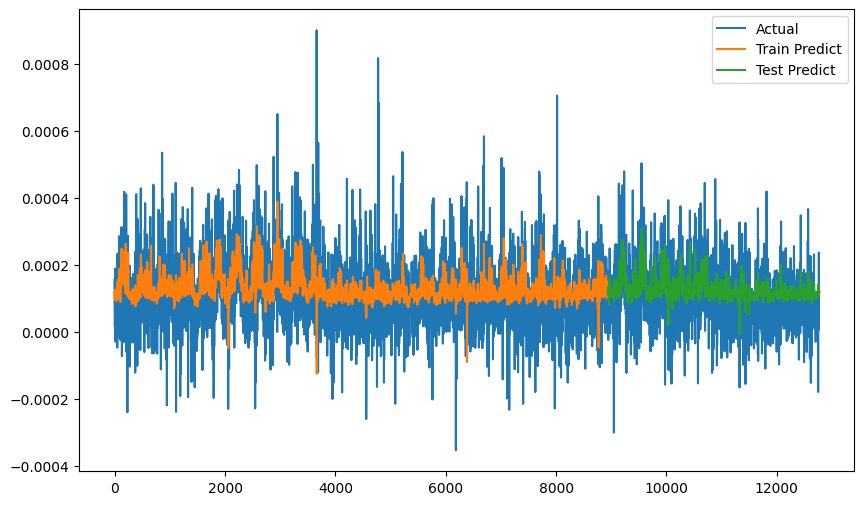

In [81]:
# Making predictions
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Inverting the normalization
train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)

# Plotting the results
import matplotlib.pyplot as plt

# Plotting original and predictions
train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))
test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

plt.figure(figsize=(10,6))
plt.plot(np.append(train_actual, test_actual), label='Actual')
plt.plot(np.append(train_predict, np.array([None]*len(test_predict))), label='Train Predict')
plt.plot(np.append(np.array([None]*len(train_predict)), test_predict), label='Test Predict')
plt.legend()
plt.show()


Processing Bibile, Monaragala...
Epoch 1/50
40/40 [==============================] - 13s 93ms/step - loss: 0.0386 - val_loss: 0.0101
Epoch 2/50
40/40 [==============================] - 1s 19ms/step - loss: 0.0094 - val_loss: 0.0092
Epoch 3/50
40/40 [==============================] - 1s 17ms/step - loss: 0.0089 - val_loss: 0.0088
Epoch 4/50
40/40 [==============================] - 1s 17ms/step - loss: 0.0091 - val_loss: 0.0091
Epoch 5/50
40/40 [==============================] - 1s 17ms/step - loss: 0.0093 - val_loss: 0.0090
Epoch 6/50
40/40 [==============================] - 1s 18ms/step - loss: 0.0091 - val_loss: 0.0091
Epoch 7/50
40/40 [==============================] - 1s 17ms/step - loss: 0.0089 - val_loss: 0.0088
Epoch 8/50
40/40 [==============================] - 1s 18ms/step - loss: 0.0091 - val_loss: 0.0091
Epoch 9/50
40/40 [==============================] - 1s 26ms/step - loss: 0.0095 - val_loss: 0.0088
Epoch 10/50
40/40 [==============================] - 1s 26ms/step - loss: 0

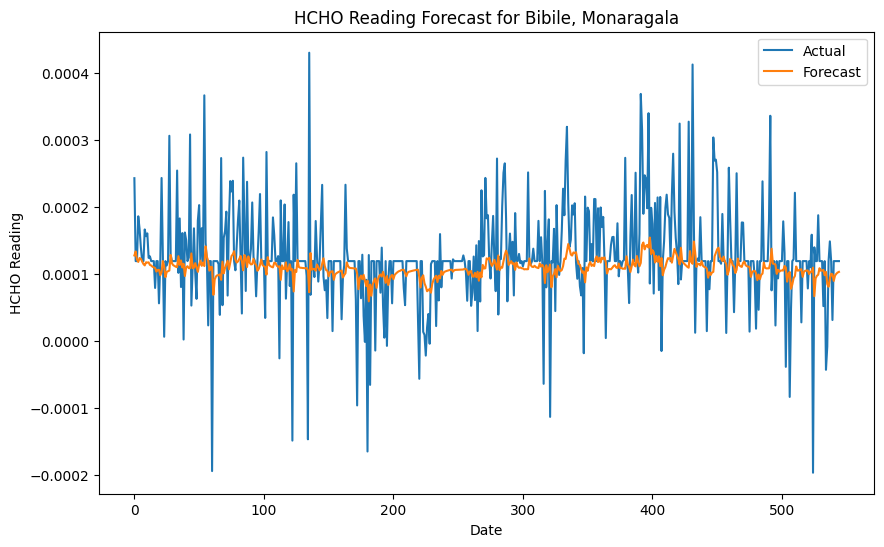

Processing Colombo Proper...
Epoch 1/50
40/40 [==============================] - 7s 57ms/step - loss: 0.0235 - val_loss: 0.0074
Epoch 2/50
40/40 [==============================] - 1s 27ms/step - loss: 0.0090 - val_loss: 0.0075
Epoch 3/50
40/40 [==============================] - 1s 29ms/step - loss: 0.0088 - val_loss: 0.0073
Epoch 4/50
40/40 [==============================] - 1s 20ms/step - loss: 0.0087 - val_loss: 0.0072
Epoch 5/50
40/40 [==============================] - 1s 18ms/step - loss: 0.0088 - val_loss: 0.0078
Epoch 6/50
40/40 [==============================] - 1s 19ms/step - loss: 0.0090 - val_loss: 0.0071
Epoch 7/50
40/40 [==============================] - 1s 19ms/step - loss: 0.0085 - val_loss: 0.0076
Epoch 8/50
40/40 [==============================] - 1s 22ms/step - loss: 0.0083 - val_loss: 0.0072
Epoch 9/50
40/40 [==============================] - 2s 45ms/step - loss: 0.0084 - val_loss: 0.0074
Epoch 10/50
40/40 [==============================] - 2s 54ms/step - loss: 0.0083

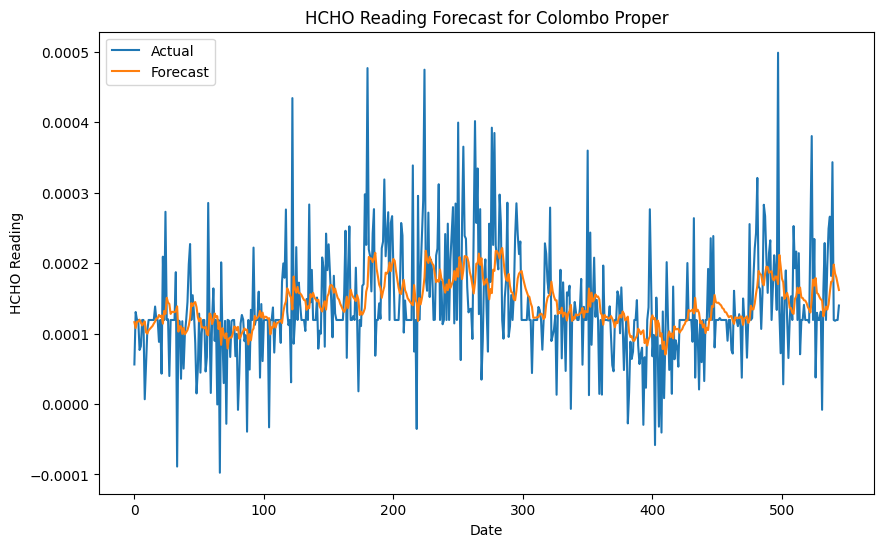

Processing Deniyaya, Matara...
Epoch 1/50
40/40 [==============================] - 7s 47ms/step - loss: 0.0071 - val_loss: 0.0035
Epoch 2/50
40/40 [==============================] - 1s 20ms/step - loss: 0.0045 - val_loss: 0.0032
Epoch 3/50
40/40 [==============================] - 1s 18ms/step - loss: 0.0043 - val_loss: 0.0041
Epoch 4/50
40/40 [==============================] - 1s 20ms/step - loss: 0.0046 - val_loss: 0.0031
Epoch 5/50
40/40 [==============================] - 1s 19ms/step - loss: 0.0044 - val_loss: 0.0032
Epoch 6/50
40/40 [==============================] - 1s 18ms/step - loss: 0.0043 - val_loss: 0.0032
Epoch 7/50
40/40 [==============================] - 1s 18ms/step - loss: 0.0044 - val_loss: 0.0031
Epoch 8/50
40/40 [==============================] - 1s 19ms/step - loss: 0.0044 - val_loss: 0.0036
Epoch 9/50
40/40 [==============================] - 1s 18ms/step - loss: 0.0042 - val_loss: 0.0032
Epoch 10/50
40/40 [==============================] - 1s 19ms/step - loss: 0.00

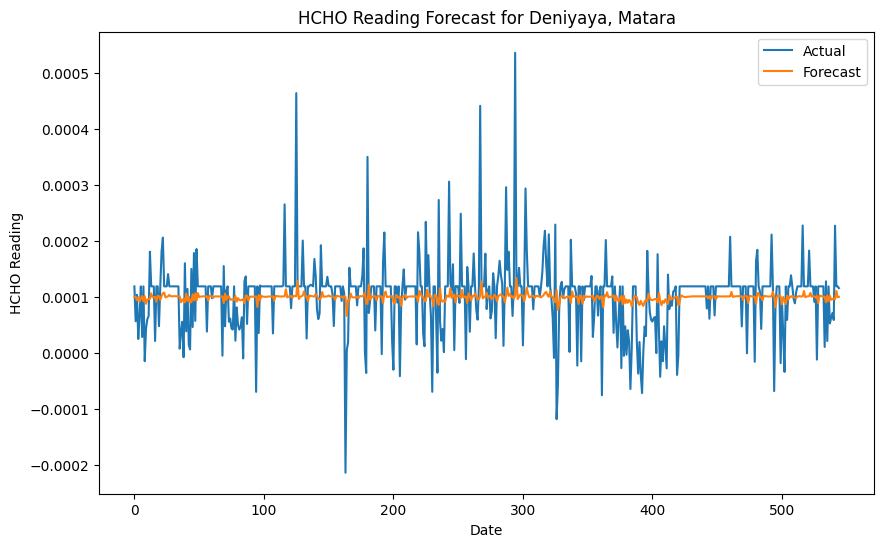

Processing Jaffna Proper...
Epoch 1/50
40/40 [==============================] - 6s 45ms/step - loss: 0.0382 - val_loss: 0.0056
Epoch 2/50
40/40 [==============================] - 1s 19ms/step - loss: 0.0055 - val_loss: 0.0056
Epoch 3/50
40/40 [==============================] - 1s 19ms/step - loss: 0.0056 - val_loss: 0.0055
Epoch 4/50
40/40 [==============================] - 1s 23ms/step - loss: 0.0057 - val_loss: 0.0055
Epoch 5/50
40/40 [==============================] - 1s 27ms/step - loss: 0.0055 - val_loss: 0.0055
Epoch 6/50
40/40 [==============================] - 1s 25ms/step - loss: 0.0057 - val_loss: 0.0055
Epoch 7/50
40/40 [==============================] - 1s 25ms/step - loss: 0.0055 - val_loss: 0.0060
Epoch 8/50
40/40 [==============================] - 1s 29ms/step - loss: 0.0057 - val_loss: 0.0055
Epoch 9/50
40/40 [==============================] - 1s 21ms/step - loss: 0.0056 - val_loss: 0.0066
Epoch 10/50
40/40 [==============================] - 1s 19ms/step - loss: 0.0058 

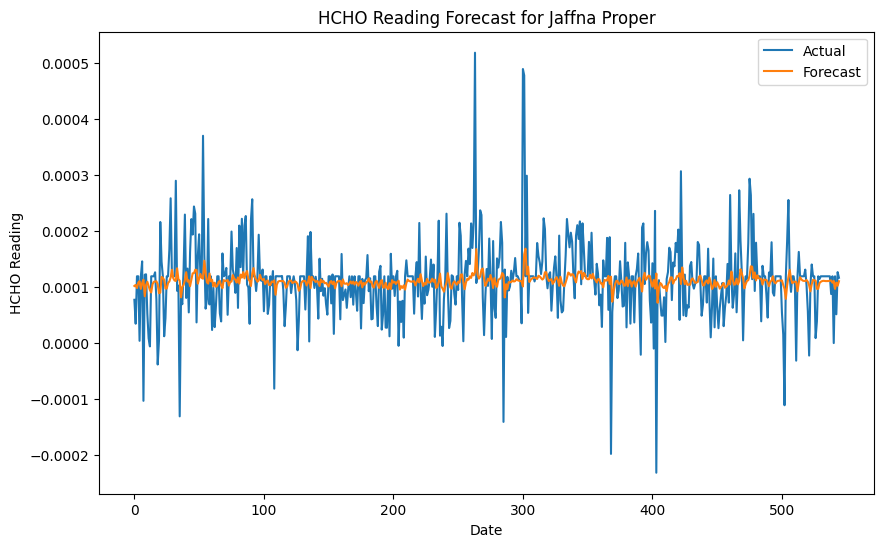

Processing Kandy Proper...
Epoch 1/50
40/40 [==============================] - 8s 43ms/step - loss: 0.0253 - val_loss: 0.0038
Epoch 2/50
40/40 [==============================] - 1s 19ms/step - loss: 0.0054 - val_loss: 0.0035
Epoch 3/50
40/40 [==============================] - 1s 18ms/step - loss: 0.0052 - val_loss: 0.0036
Epoch 4/50
40/40 [==============================] - 1s 21ms/step - loss: 0.0052 - val_loss: 0.0037
Epoch 5/50
40/40 [==============================] - 1s 19ms/step - loss: 0.0053 - val_loss: 0.0036
Epoch 6/50
40/40 [==============================] - 1s 18ms/step - loss: 0.0052 - val_loss: 0.0035
Epoch 7/50
40/40 [==============================] - 1s 19ms/step - loss: 0.0052 - val_loss: 0.0035
Epoch 8/50
40/40 [==============================] - 1s 20ms/step - loss: 0.0054 - val_loss: 0.0038
Epoch 9/50
40/40 [==============================] - 1s 20ms/step - loss: 0.0052 - val_loss: 0.0035
Epoch 10/50
40/40 [==============================] - 1s 26ms/step - loss: 0.0053 -

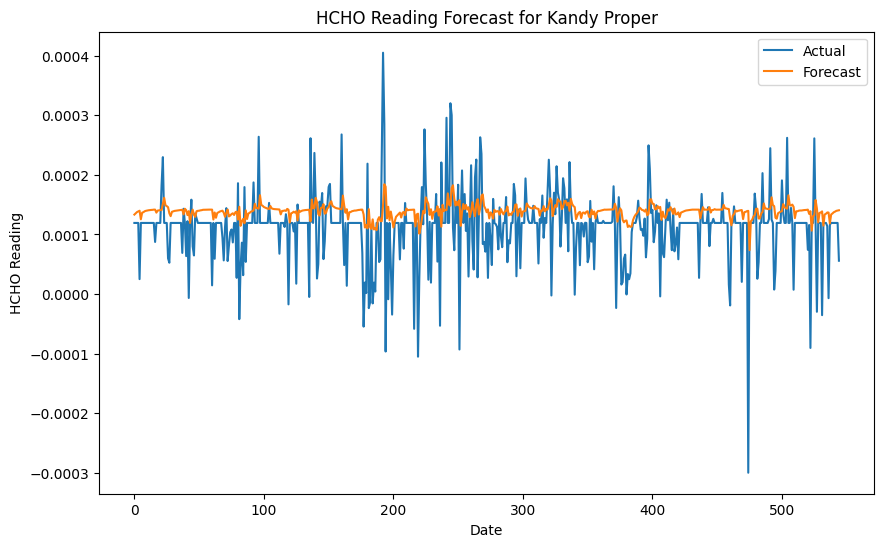

Processing Kurunegala Proper...
Epoch 1/50
40/40 [==============================] - 6s 45ms/step - loss: 0.0192 - val_loss: 0.0124
Epoch 2/50
40/40 [==============================] - 1s 19ms/step - loss: 0.0119 - val_loss: 0.0110
Epoch 3/50
40/40 [==============================] - 1s 19ms/step - loss: 0.0121 - val_loss: 0.0134
Epoch 4/50
40/40 [==============================] - 1s 21ms/step - loss: 0.0116 - val_loss: 0.0101
Epoch 5/50
40/40 [==============================] - 1s 19ms/step - loss: 0.0114 - val_loss: 0.0128
Epoch 6/50
40/40 [==============================] - 1s 20ms/step - loss: 0.0115 - val_loss: 0.0101
Epoch 7/50
40/40 [==============================] - 1s 19ms/step - loss: 0.0115 - val_loss: 0.0113
Epoch 8/50
40/40 [==============================] - 1s 26ms/step - loss: 0.0121 - val_loss: 0.0111
Epoch 9/50
40/40 [==============================] - 1s 26ms/step - loss: 0.0114 - val_loss: 0.0102
Epoch 10/50
40/40 [==============================] - 1s 32ms/step - loss: 0.0

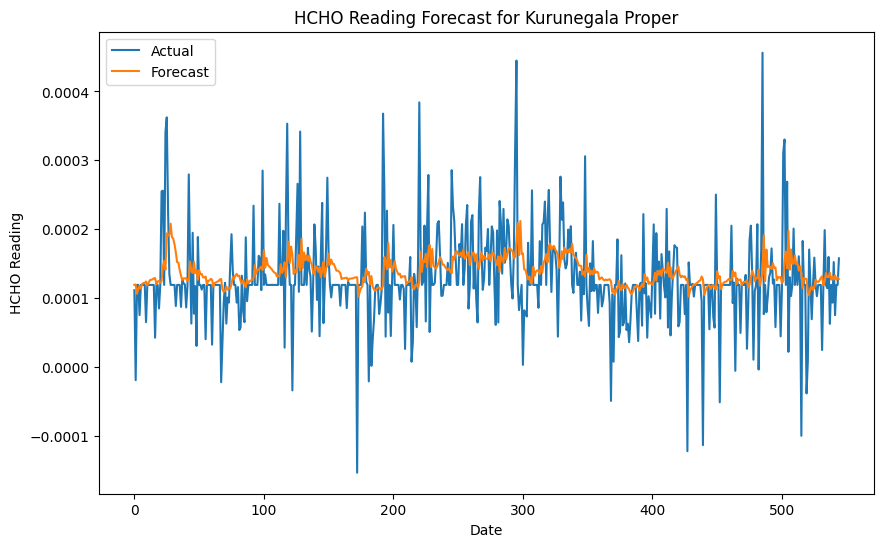

Processing Nuwara Eliya Proper...
Epoch 1/50
40/40 [==============================] - 6s 46ms/step - loss: 0.0161 - val_loss: 0.0073
Epoch 2/50
40/40 [==============================] - 1s 28ms/step - loss: 0.0095 - val_loss: 0.0072
Epoch 3/50
40/40 [==============================] - 1s 31ms/step - loss: 0.0099 - val_loss: 0.0080
Epoch 4/50
40/40 [==============================] - 1s 29ms/step - loss: 0.0104 - val_loss: 0.0073
Epoch 5/50
40/40 [==============================] - 1s 31ms/step - loss: 0.0094 - val_loss: 0.0072
Epoch 6/50
40/40 [==============================] - 1s 23ms/step - loss: 0.0094 - val_loss: 0.0096
Epoch 7/50
40/40 [==============================] - 1s 20ms/step - loss: 0.0100 - val_loss: 0.0072
Epoch 8/50
40/40 [==============================] - 1s 22ms/step - loss: 0.0094 - val_loss: 0.0080
Epoch 9/50
40/40 [==============================] - 1s 20ms/step - loss: 0.0095 - val_loss: 0.0072
Epoch 10/50
40/40 [==============================] - 1s 19ms/step - loss: 0

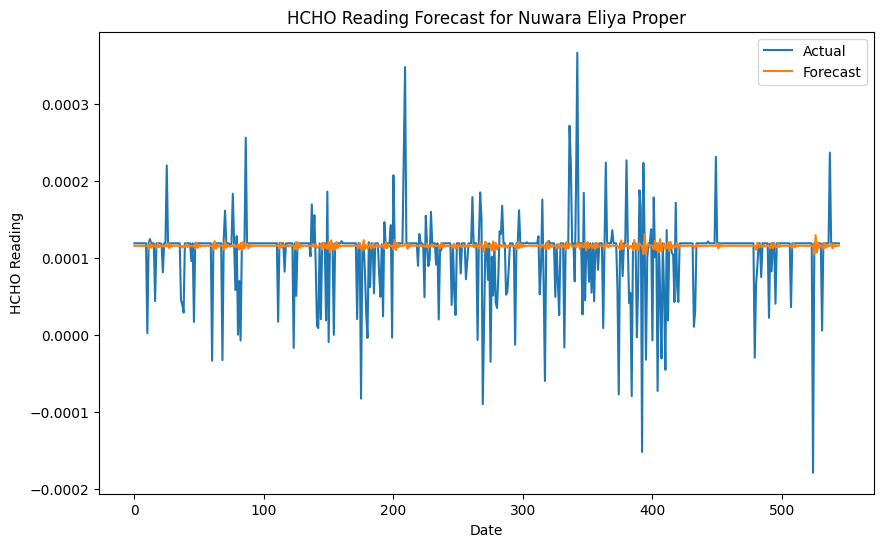

ValueError: Must pass 2-d input. shape=(7, 545, 1)

In [82]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam

# Function to create sequences for LSTM
def create_dataset(data, time_step=1):
    X, Y = [], []
    for i in range(len(data) - time_step - 1):
        a = data[i:(i + time_step)]
        X.append(a)
        Y.append(data[i + time_step])
    return np.array(X), np.array(Y)

# Assuming df_pandas is pre-loaded and sorted
# Normalize the data and handle it for each location
scaler = MinMaxScaler(feature_range=(0, 1))

results = {}
for location in df_pandas['Location'].unique():
    print(f"Processing {location}...")
    loc_data = df_pandas[df_pandas['Location'] == location]
    loc_data['Current Date'] = pd.to_datetime(loc_data['Current Date'])
    loc_data.set_index('Current Date', inplace=True)

    if loc_data['HCHO Reading'].isnull().all():
        print(f"All data for {location} are NaN. Skipping...")
        continue

    # Normalize HCHO Reading
    loc_data['Scaled HCHO'] = scaler.fit_transform(loc_data[['HCHO Reading']])

    # Prepare the dataset for LSTM
    time_step = 10
    X, y = create_dataset(loc_data['Scaled HCHO'].values, time_step)
    X = X.reshape(X.shape[0], X.shape[1], 1)

    if len(X) < 10:  # Ensure there's enough data to split
        print(f"Not enough data to fit LSTM for {location}")
        continue

    # Split data into train and test parts
    train_size = int(len(X) * 0.70)
    test_size = len(X) - train_size
    X_train, X_test = X[0:train_size], X[train_size:len(X)]
    y_train, y_test = y[0:train_size], y[train_size:len(y)]

    # Build the LSTM model
    model = Sequential([
        LSTM(50, return_sequences=True, input_shape=(time_step, 1)),
        LSTM(50),
        Dense(1)
    ])
    model.compile(optimizer=Adam(0.01), loss='mean_squared_error')

    # Fit the model
    model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=50, batch_size=32, verbose=1)

    # Forecast
    test_predict = model.predict(X_test)
    test_predict = scaler.inverse_transform(test_predict)  # Inverse scaling
    test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

    # Store results
    results[location] = test_predict

    # Visualization for each location
    plt.figure(figsize=(10, 6))
    plt.plot(test_actual, label='Actual')
    plt.plot(test_predict, label='Forecast')
    plt.title(f'HCHO Reading Forecast for {location}')
    plt.xlabel('Date')
    plt.ylabel('HCHO Reading')
    plt.legend()
    plt.show()

# Optionally convert results to DataFrame for further analysis
forecast_df = pd.DataFrame.from_dict(results, orient='index').T
print(forecast_df)


Processing Bibile, Monaragala...
Epoch 1/10
40/40 [==============================] - 12s 45ms/step - loss: 0.0297 - val_loss: 0.0108
Epoch 2/10
40/40 [==============================] - 1s 18ms/step - loss: 0.0093 - val_loss: 0.0090
Epoch 3/10
40/40 [==============================] - 1s 20ms/step - loss: 0.0091 - val_loss: 0.0090
Epoch 4/10
40/40 [==============================] - 1s 18ms/step - loss: 0.0089 - val_loss: 0.0087
Epoch 5/10
40/40 [==============================] - 1s 19ms/step - loss: 0.0092 - val_loss: 0.0089
Epoch 6/10
40/40 [==============================] - 1s 20ms/step - loss: 0.0091 - val_loss: 0.0088
Epoch 7/10
40/40 [==============================] - 1s 26ms/step - loss: 0.0090 - val_loss: 0.0088
Epoch 8/10
40/40 [==============================] - 1s 27ms/step - loss: 0.0090 - val_loss: 0.0088
Epoch 9/10
40/40 [==============================] - 1s 26ms/step - loss: 0.0092 - val_loss: 0.0089
Epoch 10/10
18/18 [==============================] - 0s 6ms/step


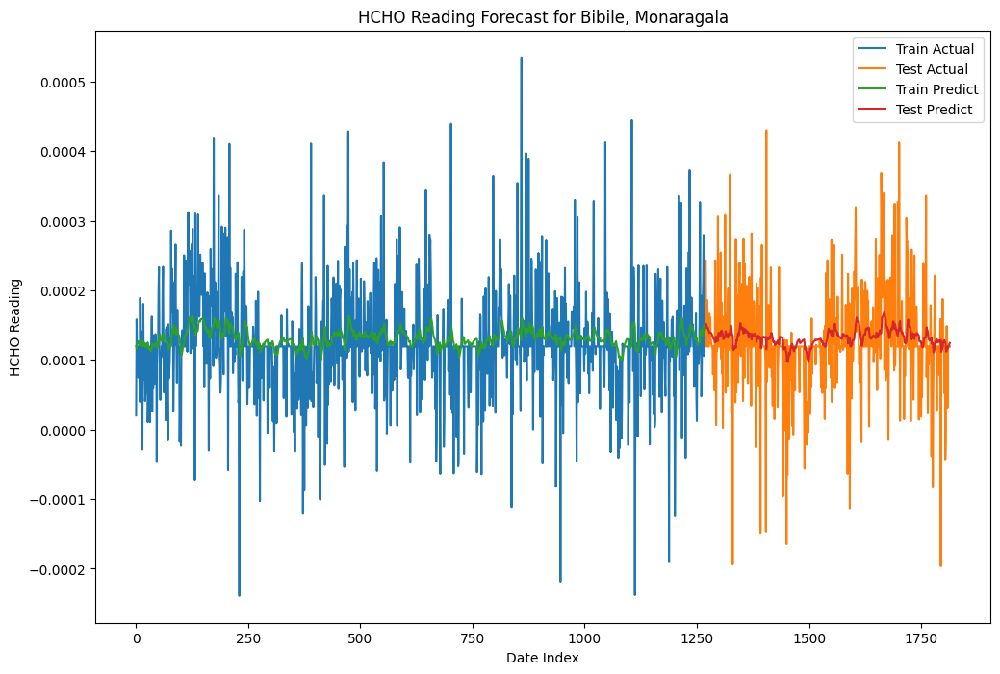

Processing Colombo Proper...
Epoch 1/10
40/40 [==============================] - 6s 45ms/step - loss: 0.0203 - val_loss: 0.0088
Epoch 2/10
40/40 [==============================] - 1s 18ms/step - loss: 0.0090 - val_loss: 0.0073
Epoch 3/10
40/40 [==============================] - 1s 19ms/step - loss: 0.0085 - val_loss: 0.0073
Epoch 4/10
40/40 [==============================] - 1s 29ms/step - loss: 0.0086 - val_loss: 0.0072
Epoch 5/10
40/40 [==============================] - 1s 27ms/step - loss: 0.0085 - val_loss: 0.0078
Epoch 6/10
40/40 [==============================] - 1s 27ms/step - loss: 0.0097 - val_loss: 0.0075
Epoch 7/10
40/40 [==============================] - 1s 29ms/step - loss: 0.0087 - val_loss: 0.0072
Epoch 8/10
40/40 [==============================] - 1s 18ms/step - loss: 0.0087 - val_loss: 0.0080
Epoch 9/10
40/40 [==============================] - 1s 18ms/step - loss: 0.0083 - val_loss: 0.0071
Epoch 10/10
18/18 [==============================] - 0s 6ms/step


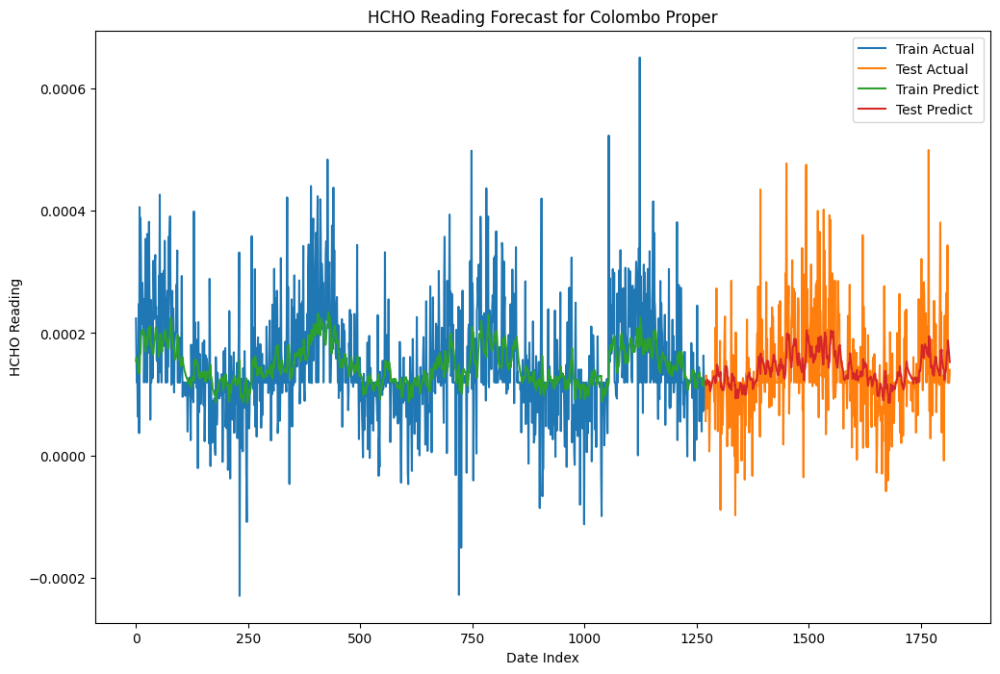

Processing Deniyaya, Matara...
Epoch 1/10
40/40 [==============================] - 6s 48ms/step - loss: 0.0089 - val_loss: 0.0038
Epoch 2/10
40/40 [==============================] - 1s 18ms/step - loss: 0.0045 - val_loss: 0.0031
Epoch 3/10
40/40 [==============================] - 1s 20ms/step - loss: 0.0044 - val_loss: 0.0032
Epoch 4/10
40/40 [==============================] - 1s 28ms/step - loss: 0.0043 - val_loss: 0.0036
Epoch 5/10
40/40 [==============================] - 1s 27ms/step - loss: 0.0046 - val_loss: 0.0036
Epoch 6/10
40/40 [==============================] - 1s 28ms/step - loss: 0.0043 - val_loss: 0.0031
Epoch 7/10
40/40 [==============================] - 1s 29ms/step - loss: 0.0043 - val_loss: 0.0031
Epoch 8/10
40/40 [==============================] - 1s 19ms/step - loss: 0.0043 - val_loss: 0.0035
Epoch 9/10
40/40 [==============================] - 1s 17ms/step - loss: 0.0045 - val_loss: 0.0031
Epoch 10/10
18/18 [==============================] - 0s 5ms/step


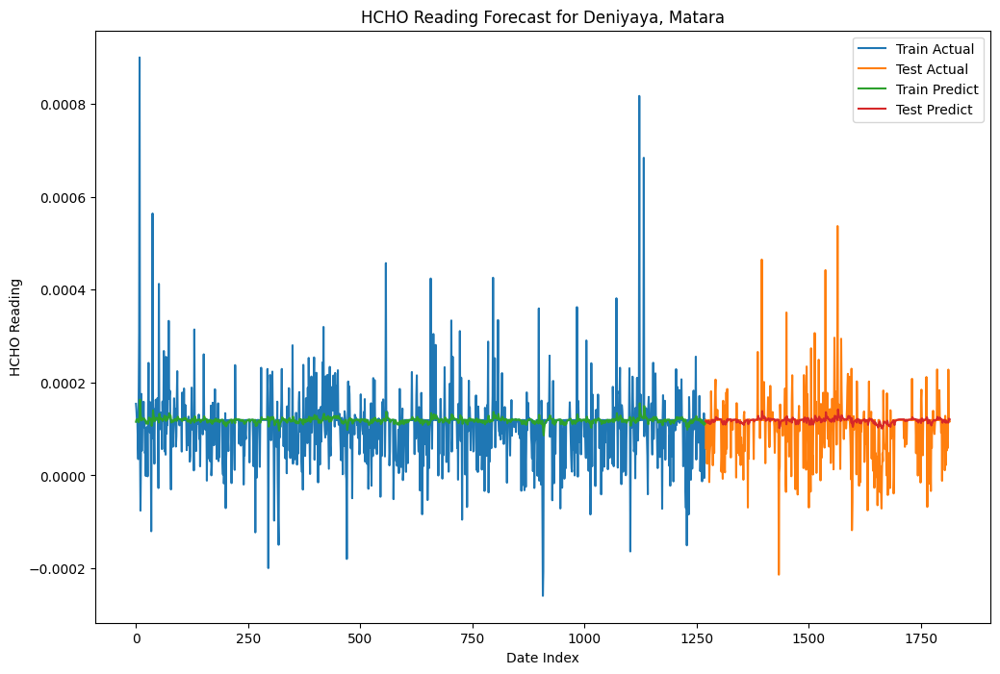

Processing Jaffna Proper...
Epoch 1/10
40/40 [==============================] - 8s 92ms/step - loss: 0.0283 - val_loss: 0.0058
Epoch 2/10
40/40 [==============================] - 1s 37ms/step - loss: 0.0055 - val_loss: 0.0055
Epoch 3/10
40/40 [==============================] - 1s 19ms/step - loss: 0.0056 - val_loss: 0.0055
Epoch 4/10
40/40 [==============================] - 1s 20ms/step - loss: 0.0056 - val_loss: 0.0057
Epoch 5/10
40/40 [==============================] - 1s 20ms/step - loss: 0.0056 - val_loss: 0.0061
Epoch 6/10
40/40 [==============================] - 1s 19ms/step - loss: 0.0058 - val_loss: 0.0056
Epoch 7/10
40/40 [==============================] - 1s 21ms/step - loss: 0.0059 - val_loss: 0.0055
Epoch 8/10
40/40 [==============================] - 1s 20ms/step - loss: 0.0057 - val_loss: 0.0059
Epoch 9/10
40/40 [==============================] - 1s 20ms/step - loss: 0.0058 - val_loss: 0.0062
Epoch 10/10
18/18 [==============================] - 0s 7ms/step


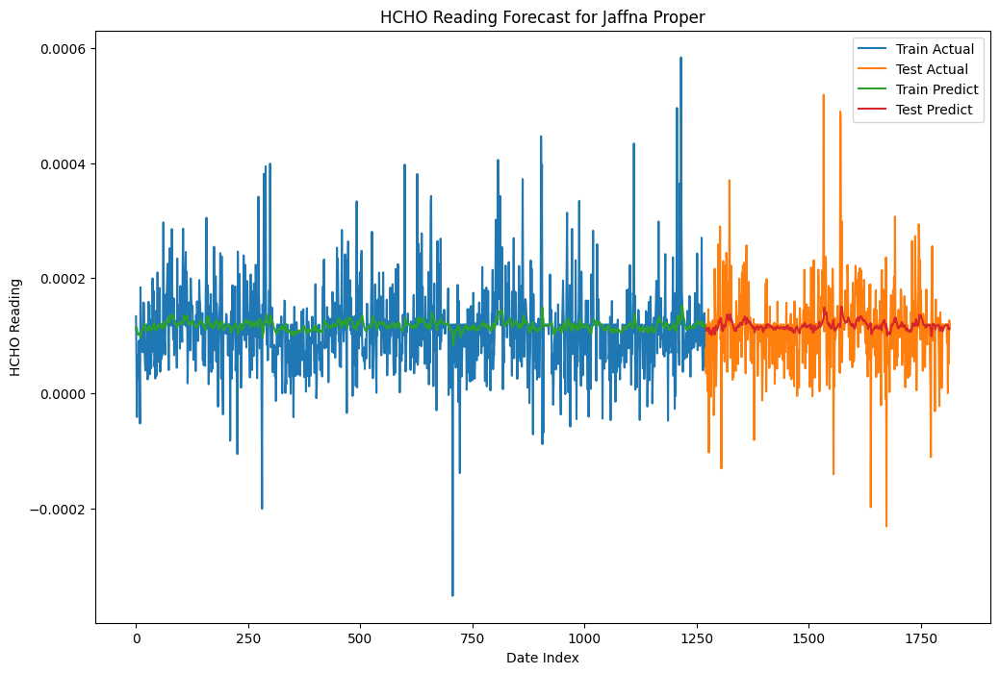

Processing Kandy Proper...
Epoch 1/10
40/40 [==============================] - 7s 62ms/step - loss: 0.0282 - val_loss: 0.0047
Epoch 2/10
40/40 [==============================] - 1s 29ms/step - loss: 0.0055 - val_loss: 0.0042
Epoch 3/10
40/40 [==============================] - 1s 31ms/step - loss: 0.0053 - val_loss: 0.0035
Epoch 4/10
40/40 [==============================] - 1s 20ms/step - loss: 0.0052 - val_loss: 0.0035
Epoch 5/10
40/40 [==============================] - 1s 19ms/step - loss: 0.0053 - val_loss: 0.0036
Epoch 6/10
40/40 [==============================] - 1s 21ms/step - loss: 0.0054 - val_loss: 0.0035
Epoch 7/10
40/40 [==============================] - 1s 20ms/step - loss: 0.0052 - val_loss: 0.0036
Epoch 8/10
40/40 [==============================] - 1s 21ms/step - loss: 0.0054 - val_loss: 0.0035
Epoch 9/10
40/40 [==============================] - 1s 22ms/step - loss: 0.0054 - val_loss: 0.0036
Epoch 10/10
18/18 [==============================] - 0s 7ms/step


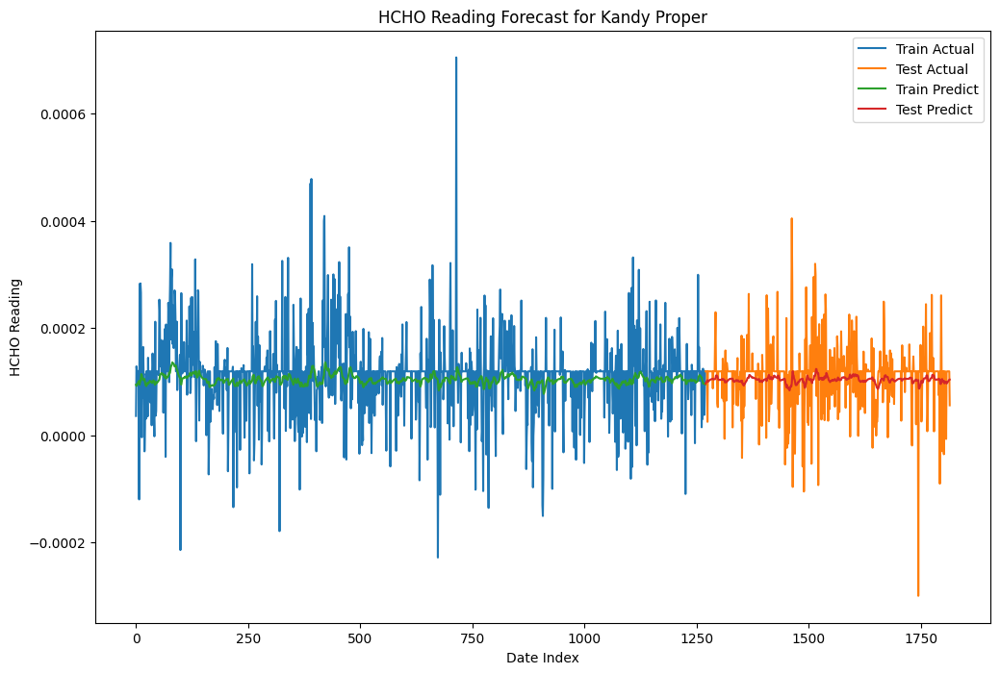

Processing Kurunegala Proper...
Epoch 1/10
40/40 [==============================] - 7s 44ms/step - loss: 0.0186 - val_loss: 0.0104
Epoch 2/10
40/40 [==============================] - 1s 21ms/step - loss: 0.0117 - val_loss: 0.0115
Epoch 3/10
40/40 [==============================] - 1s 21ms/step - loss: 0.0114 - val_loss: 0.0101
Epoch 4/10
40/40 [==============================] - 1s 20ms/step - loss: 0.0122 - val_loss: 0.0128
Epoch 5/10
40/40 [==============================] - 1s 20ms/step - loss: 0.0121 - val_loss: 0.0100
Epoch 6/10
40/40 [==============================] - 1s 21ms/step - loss: 0.0118 - val_loss: 0.0113
Epoch 7/10
40/40 [==============================] - 1s 20ms/step - loss: 0.0113 - val_loss: 0.0106
Epoch 8/10
40/40 [==============================] - 1s 20ms/step - loss: 0.0115 - val_loss: 0.0101
Epoch 9/10
40/40 [==============================] - 1s 20ms/step - loss: 0.0116 - val_loss: 0.0100
Epoch 10/10
18/18 [==============================] - 0s 9ms/step


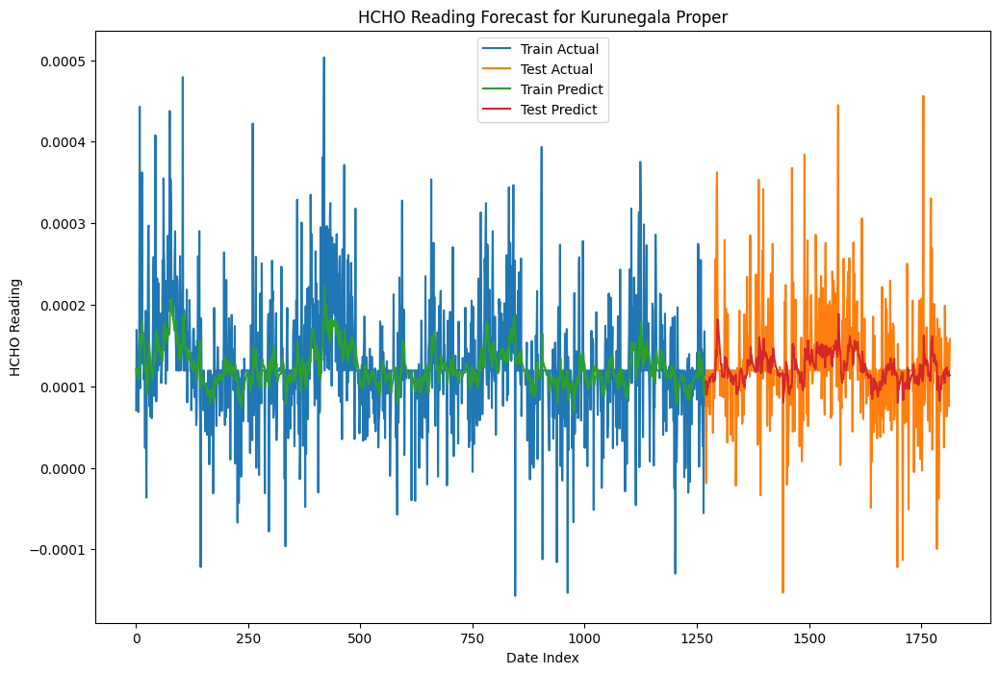

Processing Nuwara Eliya Proper...
Epoch 1/10
40/40 [==============================] - 6s 50ms/step - loss: 0.0348 - val_loss: 0.0074
Epoch 2/10
40/40 [==============================] - 1s 18ms/step - loss: 0.0094 - val_loss: 0.0074
Epoch 3/10
40/40 [==============================] - 1s 19ms/step - loss: 0.0097 - val_loss: 0.0078
Epoch 4/10
40/40 [==============================] - 1s 18ms/step - loss: 0.0095 - val_loss: 0.0072
Epoch 5/10
40/40 [==============================] - 1s 21ms/step - loss: 0.0097 - val_loss: 0.0081
Epoch 6/10
40/40 [==============================] - 1s 20ms/step - loss: 0.0094 - val_loss: 0.0074
Epoch 7/10
40/40 [==============================] - 1s 27ms/step - loss: 0.0097 - val_loss: 0.0073
Epoch 8/10
40/40 [==============================] - 1s 30ms/step - loss: 0.0095 - val_loss: 0.0072
Epoch 9/10
40/40 [==============================] - 1s 30ms/step - loss: 0.0095 - val_loss: 0.0073
Epoch 10/10
18/18 [==============================] - 0s 6ms/step


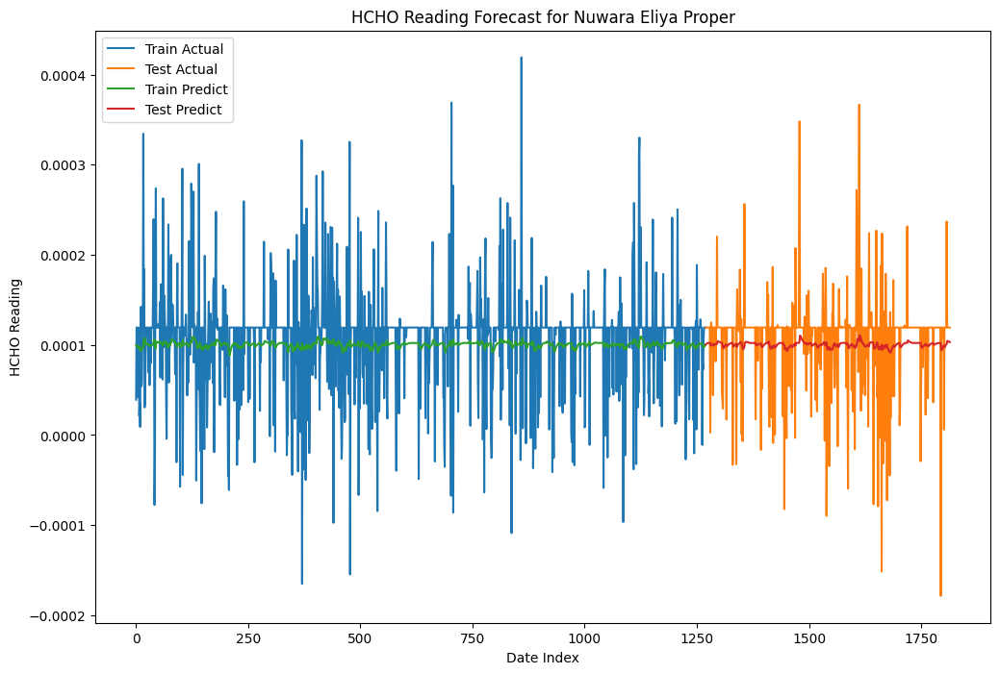

                                                                     0  \
Bibile, Monaragala   [[0.00011997652], [0.0001166222], [0.000121313...   
Colombo Proper       [[0.00015460858], [0.00016008427], [0.00015756...   
Deniyaya, Matara     [[0.00011542244], [0.000119352204], [0.0001207...   
Jaffna Proper        [[0.000112275346], [0.00011499606], [0.0001130...   
Kandy Proper         [[9.436154e-05], [9.209022e-05], [9.401379e-05...   
Kurunegala Proper    [[0.000120595454], [0.00011381797], [0.0001217...   
Nuwara Eliya Proper  [[9.9678095e-05], [9.829905e-05], [9.86177e-05...   

                                                                     1  
Bibile, Monaragala   [[0.00014658055], [0.00015179129], [0.00014952...  
Colombo Proper       [[0.00012084595], [0.00011526101], [0.00011949...  
Deniyaya, Matara     [[0.000116596624], [0.0001177848], [0.00011514...  
Jaffna Proper        [[0.00011346165], [0.00011223263], [0.00010835...  
Kandy Proper         [[9.642725e-05], [9.8

In [83]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam

# Function to create sequences for LSTM
def create_dataset(data, time_step=1):
    X, Y = [], []
    for i in range(len(data) - time_step - 1):
        a = data[i:(i + time_step)]
        X.append(a)
        Y.append(data[i + time_step])
    return np.array(X), np.array(Y)

# Normalize the data and handle it for each location
scaler = MinMaxScaler(feature_range=(0, 1))

results = {}
for location in df_pandas['Location'].unique():
    print(f"Processing {location}...")
    loc_data = df_pandas[df_pandas['Location'] == location]
    loc_data['Current Date'] = pd.to_datetime(loc_data['Current Date'])
    loc_data.set_index('Current Date', inplace=True)

    if loc_data['HCHO Reading'].isnull().all():
        print(f"All data for {location} are NaN. Skipping...")
        continue

    # Normalize HCHO Reading
    loc_data['Scaled HCHO'] = scaler.fit_transform(loc_data[['HCHO Reading']])

    # Prepare the dataset for LSTM
    time_step = 10
    X, y = create_dataset(loc_data['Scaled HCHO'].values, time_step)
    X = X.reshape(X.shape[0], X.shape[1], 1)  # Reshape for LSTM input

    if len(X) < 10:  # Ensure there's enough data to split
        print(f"Not enough data to fit LSTM for {location}")
        continue

    # Split data into train and test parts
    train_size = int(len(X) * 0.70)
    test_size = len(X) - train_size
    X_train, X_test = X[0:train_size], X[train_size:len(X)]
    y_train, y_test = y[0:train_size], y[train_size:len(y)]

    # Build the LSTM model
    model = Sequential([
        LSTM(50, return_sequences=True, input_shape=(time_step, 1)),
        LSTM(50),
        Dense(1)
    ])
    model.compile(optimizer=Adam(0.01), loss='mean_squared_error')

    # Fit the model
    model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, batch_size=32, verbose=1)

    # Forecast
    train_predict = model.predict(X_train)
    test_predict = model.predict(X_test)
    # Inverse scaling for a proper comparison
    train_predict = scaler.inverse_transform(train_predict)
    test_predict = scaler.inverse_transform(test_predict)
    y_train_inv = scaler.inverse_transform(y_train.reshape(-1, 1))
    y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

    results[location] = (train_predict, test_predict)

    # Visualization for each location
    plt.figure(figsize=(12, 8))
    plt.plot(y_train_inv, label='Train Actual')
    plt.plot(np.arange(len(y_train), len(y_train) + len(y_test)), y_test_inv, label='Test Actual')
    plt.plot(train_predict, label='Train Predict')
    plt.plot(np.arange(len(train_predict), len(train_predict) + len(test_predict)), test_predict, label='Test Predict')
    plt.title(f'HCHO Reading Forecast for {location}')
    plt.xlabel('Date Index')
    plt.ylabel('HCHO Reading')
    plt.legend()
    plt.show()

# Optionally convert results to DataFrame for further analysis
forecast_df = pd.DataFrame.from_dict({k: [v[0], v[1]] for k, v in results.items()}, orient='index')
print(forecast_df)


In [84]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Assuming you already have y_test_inv and test_predict from the previous code
mse = mean_squared_error(y_test_inv, test_predict)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_inv, test_predict)

print(f'Mean Squared Error: {mse}')
print(f'Root Mean Squared Error: {rmse}')
print(f'Mean Absolute Error: {mae}')

# Calculating MAPE, where y_test_inv and test_predict are non-zero to avoid division by zero
mape = np.mean(np.abs((y_test_inv - test_predict) / y_test_inv)) * 100
print(f'Mean Absolute Percentage Error: {mape:.2f}%')


Mean Squared Error: 2.589489531302987e-09
Root Mean Squared Error: 5.088702714153173e-05
Mean Absolute Error: 3.422751836996332e-05
Mean Absolute Percentage Error: 161.09%


In [96]:
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [97]:
# Function to create sequences for LSTM
def create_dataset(data, time_step=1):
    X, Y = [], []
    for i in range(len(data) - time_step - 1):
        a = data[i:(i + time_step)]
        X.append(a)
        Y.append(data[i + time_step])
    return np.array(X), np.array(Y)

In [98]:
# Normalize the data and handle it for each location
scaler = MinMaxScaler(feature_range=(0, 1))

evaluation_metrics = {}  # Dictionary to store evaluation metrics for each location
results = {}  # Dictionary to store predictions for each location

Processing Bibile, Monaragala...
Epoch 1/10
40/40 [==============================] - 5s 14ms/step - loss: 0.0279
Epoch 2/10
40/40 [==============================] - 1s 14ms/step - loss: 0.0093
Epoch 3/10
40/40 [==============================] - 1s 18ms/step - loss: 0.0090
Epoch 4/10
40/40 [==============================] - 1s 21ms/step - loss: 0.0091
Epoch 5/10
40/40 [==============================] - 1s 28ms/step - loss: 0.0092
Epoch 6/10
40/40 [==============================] - 1s 21ms/step - loss: 0.0096
Epoch 7/10
40/40 [==============================] - 1s 22ms/step - loss: 0.0091
Epoch 8/10
40/40 [==============================] - 1s 19ms/step - loss: 0.0090
Epoch 9/10
40/40 [==============================] - 1s 15ms/step - loss: 0.0090
Epoch 10/10
18/18 [==============================] - 0s 6ms/step


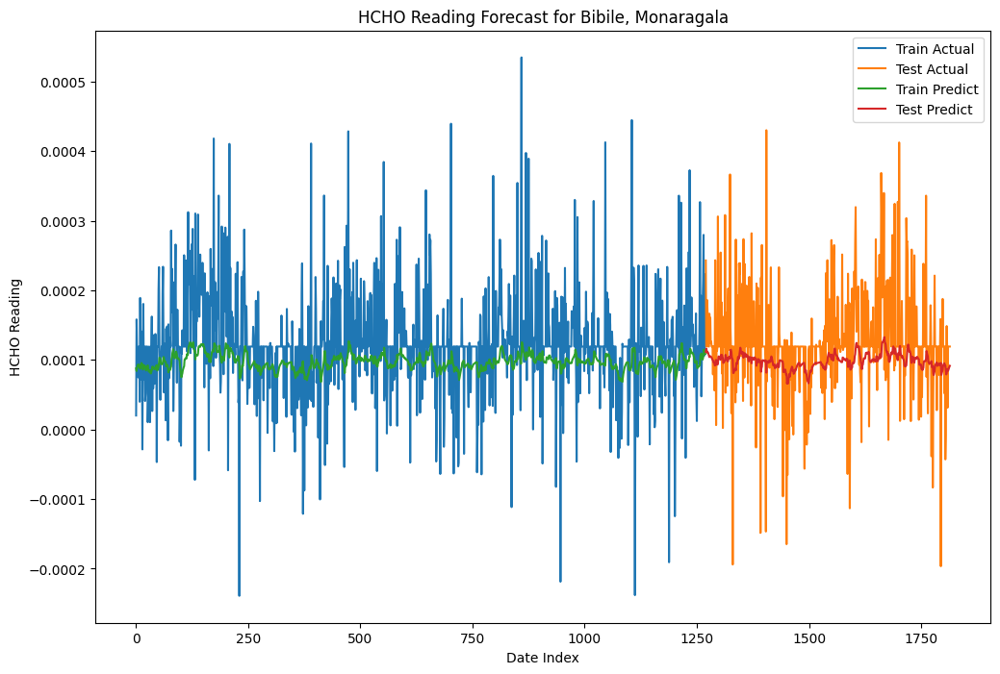

Processing Colombo Proper...
Epoch 1/10
40/40 [==============================] - 6s 22ms/step - loss: 0.0346
Epoch 2/10
40/40 [==============================] - 1s 23ms/step - loss: 0.0097
Epoch 3/10
40/40 [==============================] - 1s 23ms/step - loss: 0.0092
Epoch 4/10
40/40 [==============================] - 1s 18ms/step - loss: 0.0089
Epoch 5/10
40/40 [==============================] - 1s 15ms/step - loss: 0.0086
Epoch 6/10
40/40 [==============================] - 1s 16ms/step - loss: 0.0088
Epoch 7/10
40/40 [==============================] - 1s 14ms/step - loss: 0.0084
Epoch 8/10
40/40 [==============================] - 1s 14ms/step - loss: 0.0085
Epoch 9/10
40/40 [==============================] - 1s 14ms/step - loss: 0.0084
Epoch 10/10
18/18 [==============================] - 0s 6ms/step


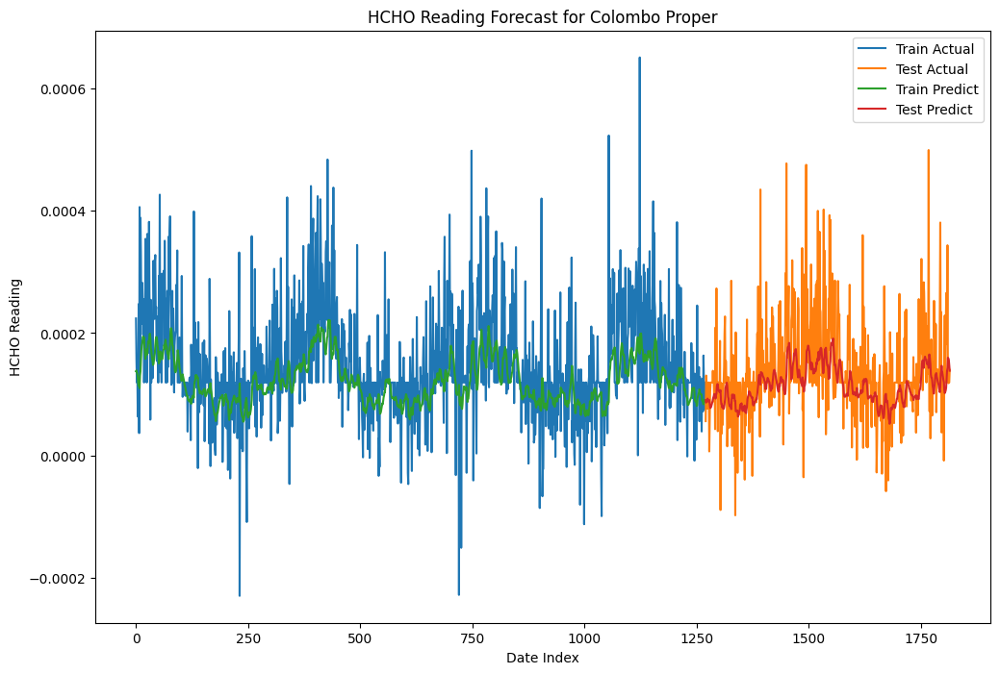

Processing Deniyaya, Matara...
Epoch 1/10
40/40 [==============================] - 8s 31ms/step - loss: 0.0132
Epoch 2/10
40/40 [==============================] - 1s 29ms/step - loss: 0.0044
Epoch 3/10
40/40 [==============================] - 1s 26ms/step - loss: 0.0043
Epoch 4/10
40/40 [==============================] - 1s 28ms/step - loss: 0.0042
Epoch 5/10
40/40 [==============================] - 1s 27ms/step - loss: 0.0044
Epoch 6/10
40/40 [==============================] - 1s 25ms/step - loss: 0.0045
Epoch 7/10
40/40 [==============================] - 1s 28ms/step - loss: 0.0044
Epoch 8/10
40/40 [==============================] - 1s 34ms/step - loss: 0.0043
Epoch 9/10
40/40 [==============================] - 1s 34ms/step - loss: 0.0045
Epoch 10/10
18/18 [==============================] - 0s 11ms/step


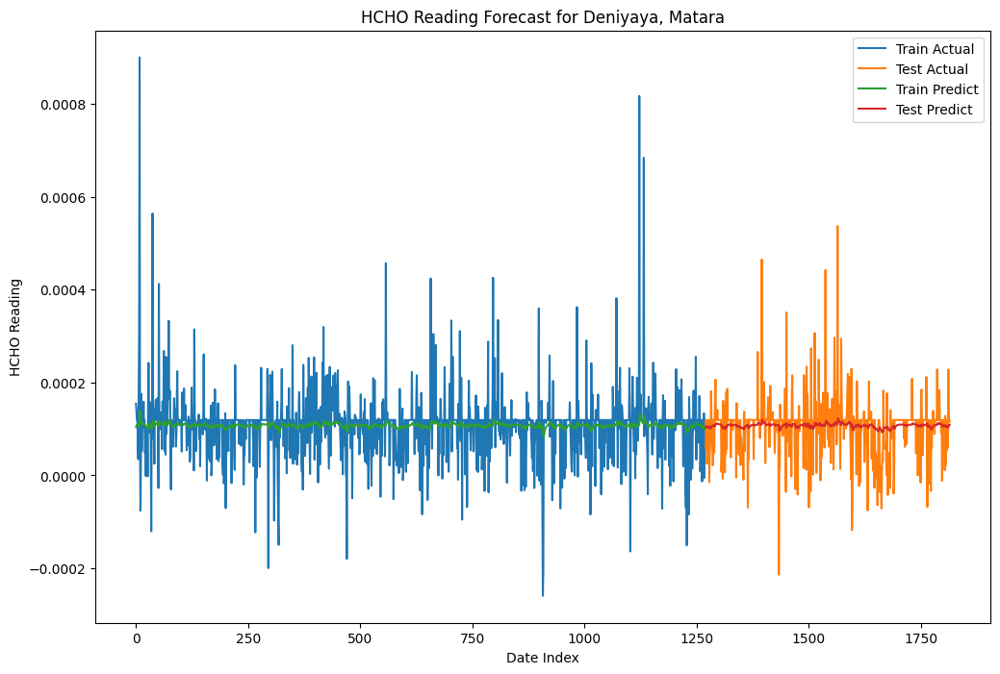

Processing Jaffna Proper...
Epoch 1/10
40/40 [==============================] - 9s 16ms/step - loss: 0.0338
Epoch 2/10
 7/40 [====>.........................] - ETA: 0s - loss: 0.0058

In [ ]:
for location in df_pandas['Location'].unique():
    print(f"Processing {location}...")
    loc_data = df_pandas[df_pandas['Location'] == location]
    loc_data['Current Date'] = pd.to_datetime(loc_data['Current Date'])
    loc_data.set_index('Current Date', inplace=True)

    if loc_data['HCHO Reading'].isnull().all():
        print(f"All data for {location} are NaN. Skipping...")
        continue

    # Normalize HCHO Reading
    loc_data['Scaled HCHO'] = scaler.fit_transform(loc_data[['HCHO Reading']])
    X, y = create_dataset(loc_data['Scaled HCHO'].values, time_step=10)
    X = X.reshape(X.shape[0], X.shape[1], 1)  # Reshape for LSTM input

    if len(X) < 10:
        print(f"Not enough data to fit LSTM for {location}")
        continue

    train_size = int(len(X) * 0.70)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    model = Sequential([
        LSTM(50, return_sequences=True, input_shape=(10, 1)),
        LSTM(50),
        Dense(1)
    ])
    model.compile(optimizer=Adam(0.01), loss='mean_squared_error')
    model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=1)

    train_predict = model.predict(X_train)
    test_predict = model.predict(X_test)
    train_predict = scaler.inverse_transform(train_predict)
    test_predict = scaler.inverse_transform(test_predict)
    y_train_inv = scaler.inverse_transform(y_train.reshape(-1, 1))
    y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

    # Store results
    results[location] = (train_predict, test_predict)

    # Compute and store evaluation metrics
    mse = mean_squared_error(y_test_inv, test_predict)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test_inv, test_predict)
    mape = np.mean(np.abs((y_test_inv - test_predict) / y_test_inv)) * 100 if np.all(y_test_inv != 0) else None

    evaluation_metrics[location] = {
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'MAPE': mape
    }

    # Visualization for each location
    plt.figure(figsize=(12, 8))
    plt.plot(y_train_inv, label='Train Actual')
    plt.plot(np.arange(len(y_train), len(y_train) + len(y_test)), y_test_inv, label='Test Actual')
    plt.plot(train_predict, label='Train Predict')
    plt.plot(np.arange(len(train_predict), len(train_predict) + len(test_predict)), test_predict, label='Test Predict')
    plt.title(f'HCHO Reading Forecast for {location}')
    plt.xlabel('Date Index')
    plt.ylabel('HCHO Reading')
    plt.legend()
    plt.show()

In [ ]:
# Optionally convert results and metrics to DataFrame for further analysis
forecast_df = pd.DataFrame.from_dict({k: [v[0], v[1]] for k, v in results.items()}, orient='index')
metrics_df = pd.DataFrame.from_dict(evaluation_metrics, orient='index')
print(metrics_df)

In [ ]:
# Plot forecasted values along with actual values for each location
for location, (train_predict, test_predict) in results.items():
    loc_data = df_pandas[df_pandas['Location'] == location]
    loc_data['Current Date'] = pd.to_datetime(loc_data['Current Date'])
    loc_data.set_index('Current Date', inplace=True)
    y_test_inv = scaler.inverse_transform(loc_data['Scaled HCHO'].iloc[-len(test_predict):].values.reshape(-1, 1))

    plt.figure(figsize=(10, 6))
    plt.plot(y_test_inv, label=f'{location} Actual', linestyle='-')
    plt.plot(test_predict, label=f'{location} Predicted')
    plt.title(f'HCHO Reading Forecast for {location}')
    plt.xlabel('Date Index')
    plt.ylabel('HCHO Reading')
    plt.legend()
    plt.show()


In [ ]:
# # Plot evaluation metrics
# metrics_df.plot(kind='bar', figsize=(10, 6))
# plt.title('Evaluation Metrics by Location')
# plt.xlabel('Location')
# plt.ylabel('Metric Value')
# plt.xticks(rotation=45)
# plt.legend(title='Metric')
# plt.show()

In [ ]:
# import pandas as pd
# import numpy as np
# from sklearn.preprocessing import MinMaxScaler
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import LSTM, Dense
# from tensorflow.keras.optimizers import Adam

# # Function to create sequences for LSTM
# def create_dataset(data, time_step=1):
#     X, Y = [], []
#     for i in range(len(data) - time_step - 1):
#         a = data[i:(i + time_step)]
#         X.append(a)
#         Y.append(data[i + time_step])
#     return np.array(X), np.array(Y)

# # Normalize the data and handle it for each location
# scaler = MinMaxScaler(feature_range=(0, 1))

# results = {}  # Dictionary to store predictions for each location

# for location in df_pandas['Location'].unique():
#     print(f"Processing {location}...")
#     loc_data = df_pandas[df_pandas['Location'] == location]
#     loc_data['Current Date'] = pd.to_datetime(loc_data['Current Date'])
#     loc_data.set_index('Current Date', inplace=True)

#     if loc_data['HCHO Reading'].isnull().all():
#         print(f"All data for {location} are NaN. Skipping...")
#         continue

#     # Normalize HCHO Reading
#     loc_data['Scaled HCHO'] = scaler.fit_transform(loc_data[['HCHO Reading']])
#     X, y = create_dataset(loc_data['Scaled HCHO'].values, time_step=10)
#     X = X.reshape(X.shape[0], X.shape[1], 1)  # Reshape for LSTM input

#     if len(X) < 10:
#         print(f"Not enough data to fit LSTM for {location}")
#         continue

#     train_size = int(len(X) * 0.70)
#     X_train, X_test = X[:train_size], X[train_size:]
#     y_train, y_test = y[:train_size], y[train_size:]

#     model = Sequential([
#         LSTM(50, return_sequences=True, input_shape=(10, 1)),
#         LSTM(50),
#         Dense(1)
#     ])
#     model.compile(optimizer=Adam(0.01), loss='mean_squared_error')
#     model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=1)

#     train_predict = model.predict(X_train)
#     test_predict = model.predict(X_test)
#     train_predict = scaler.inverse_transform(train_predict)
#     test_predict = scaler.inverse_transform(test_predict)
#     y_train_inv = scaler.inverse_transform(y_train.reshape(-1, 1))
#     y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

#     # Store results
#     results[location] = (train_predict, test_predict)

# # Optionally convert results to DataFrame for further analysis
# forecast_df = pd.DataFrame.from_dict({k: [v[0], v[1]] for k, v in results.items()}, orient='index')


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

evaluation_metrics = {}  # Dictionary to store evaluation metrics for each location

for location, (train_predict, test_predict) in results.items():
    # Compute and store evaluation metrics
    mse = mean_squared_error(y_test_inv, test_predict)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test_inv, test_predict)
    mape = np.mean(np.abs((y_test_inv - test_predict) / y_test_inv)) * 100 if np.all(y_test_inv != 0) else None

    evaluation_metrics[location] = {
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'MAPE': mape
    }

# Optionally convert evaluation metrics to DataFrame for further analysis
metrics_df = pd.DataFrame.from_dict(evaluation_metrics, orient='index')
print(metrics_df)
